In [1]:
use_tpu = False
if use_tpu:    
    !curl https://raw.githubusercontent.com/pytorch/xla/master/contrib/scripts/env-setup.py -o pytorch-xla-env-setup.py
    !python pytorch-xla-env-setup.py --version nightly --apt-packages libomp5 libopenblas-dev
    
    # has to be imported before torch, otherwise error are thrown
    import torch_xla
    import torch_xla.core.xla_model as xm
    import torch_xla.distributed.xla_multiprocessing as xmp
    import torch_xla.distributed.parallel_loader as pl
    import torch_xla.utils.serialization as xser

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import albumentations
import multiprocessing
import torchvision
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import time
import gc
import math

device = "cuda" if torch.cuda.is_available() else "cpu"

if use_tpu:
    os.environ['XLA_USE_BF16']= "1"
    os.environ['XLA_TENSOR_ALLOCATOR_MAXSIZE'] = "100000000"
else:
    torch.backends.cudnn.benchmark = True

In [2]:
image_paths = os.listdir("../input/flickrfaceshq-dataset-ffhq")
image_paths = [f"../input/flickrfaceshq-dataset-ffhq/{el}" for el in image_paths]

class ImageDataset(Dataset):
    def __init__(self, image_paths):
        super().__init__()
        self.image_paths = image_paths
        """self.transform = albumentations.Compose([
            albumentations.RandomCrop(height=128, width=128),
            albumentations.augmentations.transforms.HorizontalFlip(p=0.5)
        ])"""
        self.transform = albumentations.augmentations.transforms.HorizontalFlip(p=0.5)
        self.normalise = torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, index):
        image = cv2.imread(self.image_paths[index])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255.0

        # if image.shape[0] < 128 or image.shape[1] < 128:
        image = cv2.resize(image, (128, 128))
        image = self.transform(image=image)['image']
        image = self.normalise(torch.from_numpy(image).permute(2, 0, 1))
        return image

In [3]:
class GeneratorBlock(nn.Module):
    def __init__(self, latent_dim, input_channels, filters, device, upsample = True):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False) if upsample else None

        self.to_style1 = nn.Linear(latent_dim, input_channels)
        self.to_noise1 = nn.Linear(1, filters)
        self.conv1 = Conv2DMod(input_channels, filters, 3, device=device)
        
        self.to_style2 = nn.Linear(latent_dim, filters)
        self.to_noise2 = nn.Linear(1, filters)
        self.conv2 = Conv2DMod(filters, filters, 3, device=device)
    
        self.activation = nn.LeakyReLU(0.2)
        self.perform_upsampling = upsample

    def forward(self, x, istyle, inoise):
        if self.perform_upsampling:
            x = self.upsample(x)

        inoise = inoise[:, :x.shape[2], :x.shape[3], :]
        noise1 = self.to_noise1(inoise).permute((0, 3, 2, 1))
        noise2 = self.to_noise2(inoise).permute((0, 3, 2, 1))

        style1 = self.to_style1(istyle)
        x = self.conv1(x, style1)
        x = self.activation(x + noise1)

        style2 = self.to_style2(istyle)
        x = self.conv2(x, style2)
        x = self.activation(x + noise2)
        return x

class MappingNetwork(nn.Module):
    def __init__(self, dims, n_layers=8, activation=nn.LeakyReLU(0.2)):
        super().__init__()
        self.norm = nn.LayerNorm(dims)
        layers = []
        for i in range(n_layers):
            layers.append(nn.Linear(dims, dims))
            if i != n_layers - 1:
                layers.append(activation)
        self.layers = nn.Sequential(*layers)
    
    def forward(self, x):
        x = self.norm(x)
        return self.layers(x)
        
class StyleGenerator(nn.Module):
    def __init__(self, z_dim, device, channel_multiplier=2):
        super().__init__()
        self.channels = {
            4: 512,
            8: 512,
            16: 512,
            32: 512,
            64: 256 * channel_multiplier,
            128: 128 * channel_multiplier,
            256: 64 * channel_multiplier,
            512: 32 * channel_multiplier,
            1024: 16 * channel_multiplier,
        }
        self.m_net = MappingNetwork(z_dim)
        self.z_dim = z_dim
        self.device = device
        self.const = nn.Parameter(torch.randn((1, self.channels[4], 4, 4), dtype=torch.float32, device=device))
        self.l1 = GeneratorBlock(input_channels=self.channels[4], filters=self.channels[4], upsample=False, latent_dim=z_dim, device=device)
        self.l2 = GeneratorBlock(input_channels=self.channels[4], filters=self.channels[8], upsample=True, latent_dim=z_dim, device=device)
        self.l3 = GeneratorBlock(input_channels=self.channels[8], filters=self.channels[16], upsample=True, latent_dim=z_dim, device=device)
        self.l4 = GeneratorBlock(input_channels=self.channels[16], filters=self.channels[32], upsample=True, latent_dim=z_dim, device=device)
        self.l5 = GeneratorBlock(input_channels=self.channels[32], filters=self.channels[64], upsample=True, latent_dim=z_dim, device=device)
        self.l6 = GeneratorBlock(input_channels=self.channels[64], filters=self.channels[128], upsample=True, latent_dim=z_dim, device=device)
        self.conv = nn.Conv2d(self.channels[128], 3, kernel_size=1, padding=0, stride=1)
        
    def forward(self, batch_size):
        z = torch.rand((batch_size, self.z_dim), dtype=torch.float32, device=self.device)
        noise = torch.FloatTensor(batch_size, 128, 128, 1).uniform_(0., 1.).to(self.device)
        w = self.m_net(z)
        x = self.const.expand(batch_size, 512, 4, 4)
        x = self.l1(x, w, noise)
        x = self.l2(x, w, noise)
        x = self.l3(x, w, noise)
        x = self.l4(x, w, noise)
        x = self.l5(x, w, noise)
        x = self.l6(x, w, noise)
        x = self.conv(x)
        return x

def image_noise(n, im_size, device):
    return torch.FloatTensor(n, im_size, im_size, 1).uniform_(0., 1.).to(device)
    
class Conv2DMod(nn.Module):
    def __init__(self, in_chan, out_chan, kernel, device, demod=True, stride=1, dilation=1, eps = 1e-8, **kwargs):
        super().__init__()
        self.filters = out_chan
        self.demod = demod
        self.kernel = kernel
        self.stride = stride
        self.dilation = dilation
        self.weight = nn.Parameter(torch.randn((out_chan, in_chan, kernel, kernel), device=device))
        self.eps = eps
        self.device = device
        nn.init.kaiming_normal_(self.weight, a=0, mode='fan_in', nonlinearity='leaky_relu')
    
    def _get_same_padding(self, size, kernel, dilation, stride):
        return ((size - 1) * (stride - 1) + dilation * (kernel - 1)) // 2

    def forward(self, x, y):
        b, c, h, w = x.shape

        w1 = y[:, None, :, None, None]
        w2 = self.weight[None, :, :, :, :]
        weights = w2 * (w1 + 1)

        if self.demod:
            d = torch.rsqrt((weights ** 2).sum(dim=(2, 3, 4), keepdim=True).to(self.device) + self.eps)
            weights = weights * d

        x = x.reshape(1, -1, h, w)

        _, _, *ws = weights.shape
        weights = weights.reshape(b * self.filters, *ws)

        padding = self._get_same_padding(h, self.kernel, self.dilation, self.stride)
        x = F.conv2d(x, weights, padding=padding, groups=b)

        x = x.reshape(-1, self.filters, h, w)
        return x
         
class ConvBlock(nn.Module):
    '''
    Used to construct progressive discriminator
    '''
    def __init__(self, in_channel, out_channel, size_kernel1, padding1, 
                 size_kernel2 = None, padding2 = None):
        super().__init__()
        
        if size_kernel2 == None:
            size_kernel2 = size_kernel1
        if padding2 == None:
            padding2 = padding1
        
        self.conv = nn.Sequential(
            SConv2d(in_channel, out_channel, size_kernel1, padding=padding1),
            nn.LeakyReLU(0.2),
            SConv2d(out_channel, out_channel, size_kernel2, padding=padding2),
            nn.LeakyReLU(0.2)
        )
    
    def forward(self, image):
        # Downsample now proxyed by discriminator
        # result = nn.functional.interpolate(image, scale_factor=0.5, mode="bilinear", align_corners=False)
        # Conv
        result = self.conv(image)
        return result
    
# Scaled weight - He initialization
# "explicitly scale the weights at runtime"
class ScaleW:
    '''
    Constructor: name - name of attribute to be scaled
    '''
    def __init__(self, name):
        self.name = name
    
    def scale(self, module):
        weight = getattr(module, self.name + '_orig')
        fan_in = weight.data.size(1) * weight.data[0][0].numel()
        
        return weight * math.sqrt(2 / fan_in)
    
    @staticmethod
    def apply(module, name):
        '''
        Apply runtime scaling to specific module
        '''
        hook = ScaleW(name)
        weight = getattr(module, name)
        module.register_parameter(name + '_orig', nn.Parameter(weight.data))
        del module._parameters[name]
        module.register_forward_pre_hook(hook)
    
    def __call__(self, module, whatever):
        weight = self.scale(module)
        setattr(module, self.name, weight)
    
def quick_scale(module, name='weight'):
    ScaleW.apply(module, name)
    return module

class SLinear(nn.Module):
    def __init__(self, dim_in, dim_out):
        super().__init__()

        linear = nn.Linear(dim_in, dim_out)
        linear.weight.data.normal_()
        linear.bias.data.zero_()
        
        self.linear = quick_scale(linear)

    def forward(self, x):
        return self.linear(x)

# Uniformly set the hyperparameters of Conv2d
# "We initialize all weights of the convolutional, fully-connected, and affine transform layers using N(0, 1)"
# 5/13: Apply scaled weights
class SConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.Conv2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()
        
        self.conv = quick_scale(conv)

    def forward(self, x):
        return self.conv(x)
    

# Discriminator
# 5/13: Support progressive training
# 5/13: Add downsample module
# Component of Progressive GAN
# Reference: Karras, T., Aila, T., Laine, S., & Lehtinen, J. (2017).
# Progressive Growing of GANs for Improved Quality, Stability, and Variation, 1–26.
# Retrieved from http://arxiv.org/abs/1710.10196
class Discriminator(nn.Module):
    '''
    Main Module
    '''
    def __init__(self):
        super().__init__()
        # Waiting to adjust the size
        """self.from_rgbs = nn.ModuleList([
            SConv2d(3, 16, 1)
        ])"""
        """self.from_rgbs = nn.ModuleList([
            SConv2d(3, 16, 1),
            SConv2d(3, 32, 1),
            SConv2d(3, 64, 1),
            SConv2d(3, 128, 1),
            SConv2d(3, 256, 1),
            SConv2d(3, 512, 1),
            SConv2d(3, 512, 1),
            SConv2d(3, 512, 1),
            SConv2d(3, 512, 1)
       ])"""
        self.convs  = nn.ModuleList([
            ConvBlock(3, 32, 3, 1),
            ConvBlock(32, 64, 3, 1),
            ConvBlock(64, 128, 3, 1),
            ConvBlock(128, 256, 3, 1),
            ConvBlock(256, 512, 3, 1),
            ConvBlock(512, 512, 3, 1),
            ConvBlock(512, 512, 3, 1),
            ConvBlock(512, 512, 3, 1),
            ConvBlock(513, 512, 3, 1, 4, 0)
        ])
        self.fc = SLinear(512, 1)
            
    def forward(self, image):
        result = image
        for i in range(len(self.convs)):
            # Get the index of current layer
            # Count from the bottom layer (4 * 4)
            layer_index = i
            
            # Before final layer, do minibatch stddev
            if i == len(self.convs) - 1:
                # In dim: [batch, channel(512), 4, 4] 
                res_var = result.var(0, unbiased=False) + 1e-8 # Avoid zero
                # Out dim: [channel(512), 4, 4]
                res_std = torch.sqrt(res_var)
                # Out dim: [channel(512), 4, 4]
                mean_std = res_std.mean().expand(result.size(0), 1, 4, 4)
                # Out dim: [1] -> [batch, 1, 4, 4]
                result = torch.cat([result, mean_std], 1)
                # Out dim: [batch, 512 + 1, 4, 4]
            # Conv
            result = self.convs[layer_index](result)
            
            if i != len(self.convs) - 1:
                # Downsample for further usage
                if i < 5:
                    result = nn.functional.interpolate(result, scale_factor=0.5, mode='bilinear',
                                                      align_corners=False)
        
        result = result.squeeze(2).squeeze(2)
        result = self.fc(result)
        return result

In [4]:
def adv_loss_disc(y_pred_real, y_pred_fake):
    return -torch.mean(y_pred_real) + torch.mean(y_pred_fake)
    
def adv_loss_gen(y_pred_fake):
    return - torch.mean(y_pred_fake)

def gen_hinge_loss(y_pred_fake):
    return y_pred_fake.mean()

def hinge_loss(y_pred_real, y_pred_fake):
    return (F.relu(1 + y_pred_real) + F.relu(1 - y_pred_fake)).mean()

def d_logistic_loss(real_pred, fake_pred):
    real_loss = F.softplus(-real_pred)
    fake_loss = F.softplus(fake_pred)

    return real_loss.mean() + fake_loss.mean()

def g_nonsaturating_loss(fake_pred):
    loss = F.softplus(-fake_pred).mean()

    return loss

In [5]:
def renormalise(img):
    return (img * 0.5) + 0.5

def plot_progress(x, x_fake):
    x = renormalise(x)
    x_fake = renormalise(x_fake) 
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))

    ax[0].imshow(torch.clamp(x[0], 0, 1).cpu().permute(1, 2, 0), cmap="gray", vmin=0.0, vmax=1.0)
    ax[1].imshow(torch.clamp(x_fake[0], 0, 1).detach().cpu().permute(1, 2, 0), cmap="gray", vmin=0.0, vmax=1.0)
    plt.show()

def train_fn(index, flags):
    if flags['use_tpu']:
        # Sets a common random seed - both for initialization and ensuring graph is the same
        torch.manual_seed(flags['seed'])
        # Acquires the (unique) Cloud TPU core corresponding to this process's index
        device = xm.xla_device()  
        ds_train = ImageDataset(image_paths)
        train_sampler = torch.utils.data.distributed.DistributedSampler(
            ds_train,
            num_replicas=xm.xrt_world_size(),
            rank=xm.get_ordinal(),
            shuffle=True
        )
        batch_size=16
        train_loader = DataLoader(
              ds_train,
              batch_size=batch_size, 
              sampler=train_sampler,
              num_workers=multiprocessing.cpu_count(),
              drop_last=True
        )
        print_fn = xm.master_print
        def save_fn(state_dict, path):
            if os.path.exists(path):
                os.remove(path)
            xser.save(state_dict, path)

    else:
        device = "cuda" if torch.cuda.is_available() else "cpu"
        ds_train = ImageDataset(image_paths)
        batch_size = 22
        train_loader = DataLoader(
              ds_train,
              batch_size=batch_size,
              num_workers=multiprocessing.cpu_count(),
              shuffle=True,
              drop_last=True
        )
        print_fn = print
        save_fn = torch.save
        
    gen = StyleGenerator(512, device).to(device)
    disc = Discriminator().to(device)
    optim_gen = torch.optim.Adam(gen.parameters(), lr=0.002, betas=(0, 0.99))
    optim_disc = torch.optim.Adam(disc.parameters(), lr=0.002, betas=(0, 0.99))

    #gen.load_state_dict(torch.load("../input/stylegan/gen_model", map_location=torch.device("cpu")))if use_tpu:

    # disc.load_state_dict(torch.load("../input/stylegan/disc_model", map_location=torch.device("cpu")))
    #optim_gen.load_state_dict(torch.load("../input/stylegan/optim_gen", map_location=torch.device("cpu")))
    # optim_disc.load_state_dict(torch.load("../input/stylegan/optim_disc", map_location=torch.device("cpu")))

    for epoch in range(1, flags['num_epochs'] + 1):
        """if index == 0:
            save_fn(gen.state_dict(), "./gen_model")
            save_fn(optim_gen.state_dict(), './optim_gen')
            save_fn(disc.state_dict(), './disc_model')
            save_fn(optim_disc.state_dict(), './optim_disc')"""
        if flags['use_tpu']:
            train_sampler.set_epoch(epoch)
            train_iterator = pl.ParallelLoader(train_loader, [device]).per_device_loader(device)
        else:
            train_iterator = tqdm(train_loader)
        iter_times, gen_losses, disc_losses = [], [], []
        for i, x in enumerate(train_iterator):
            if index == 0:
                start_time = time.time()
            x = x.to(device).float()
            with torch.no_grad():
                fake_imgs = gen(x.shape[0])
            y_pred_real = disc(x)
            y_pred_fake = disc(fake_imgs)
            disc_loss = d_logistic_loss(y_pred_real, y_pred_fake)
            optim_disc.zero_grad()
            disc_loss.backward()
            nn.utils.clip_grad_norm_(disc.parameters(), flags['grad_clip_value'])
            if flags['use_tpu']:
                xm.optimizer_step(optim_disc)
            else:
                optim_disc.step()
            disc_losses.append(disc_loss.item())
            
            """del y_pred_real, y_pred_fake, disc_loss
            gc.collect()"""
                    
            # train generator
            fake_imgs = gen(x.shape[0])
            y_pred_fake = disc(fake_imgs)
            gen_loss = g_nonsaturating_loss(y_pred_fake)

            optim_gen.zero_grad()
            gen_loss.backward()
            nn.utils.clip_grad_norm_(gen.parameters(), flags['grad_clip_value'])
            if flags['use_tpu']:
                xm.optimizer_step(optim_gen)
            else:
                optim_gen.step()

            gen_losses.append(gen_loss.item())
            
            """ del fake_imgs
            gc.collect()"""
            
            if flags['use_tpu']:
                if index == 0:
                    time_elapsed = time.time() - start_time
                    iter_times.append(time_elapsed)
                    if i % 10 == 0 and i  != 0:
                        print_fn(f"{epoch}/{flags['num_epochs']}, ITERATION {i}/{52000 / (batch_size * 8)}, {round(np.mean(iter_times), 4)}s, gen_loss: {round(np.mean(gen_losses), 6)} disc_loss: {round(np.mean(disc_losses), 6)}")
                        plot_progress(x, fake_imgs)
            else:
                if i % 100  == 0 and i != 0:
                    print_fn(f"{epoch}/{flags['num_epochs']}, ITERATION {i} gen_loss: {round(np.mean(gen_losses), 6)} disc_loss: {round(np.mean(disc_losses), 6)}")
                    plot_progress(x, fake_imgs)
                
        if index == 0:
            save_fn(gen.state_dict(), "./gen_model")
            save_fn(optim_gen.state_dict(), './optim_gen')
            save_fn(disc.state_dict(), './disc_model')
            save_fn(optim_disc.state_dict(), './optim_disc')  

2/6, ITERATION 700 gen_loss: 4.085954 disc_loss: 1.051175


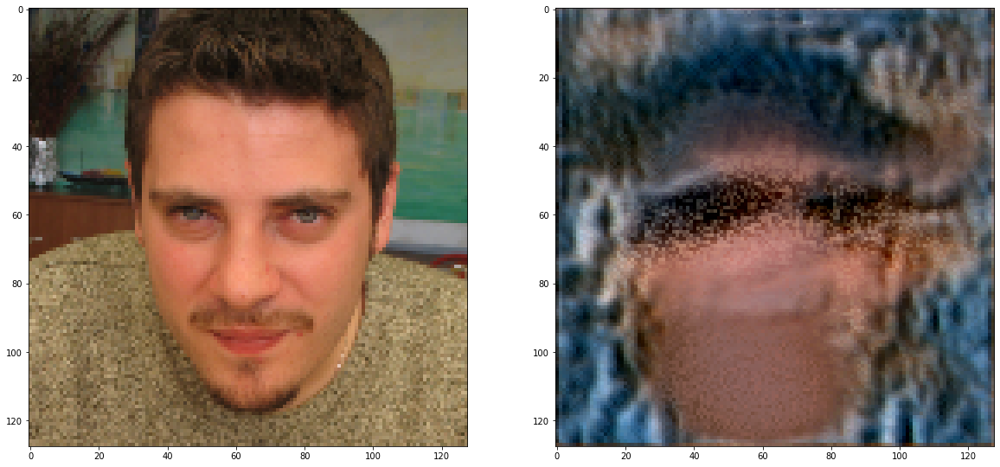

2/6, ITERATION 800 gen_loss: 3.956186 disc_loss: 1.082373


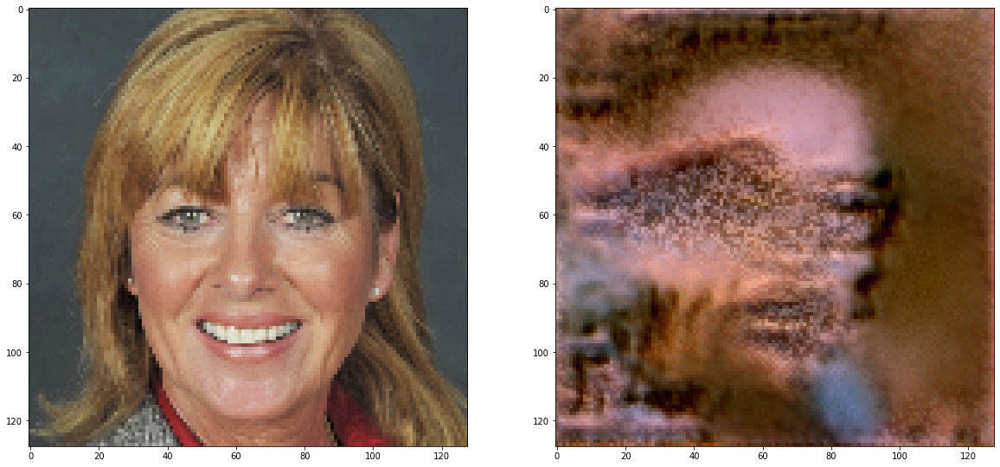

2/6, ITERATION 900 gen_loss: 3.834991 disc_loss: 1.088794


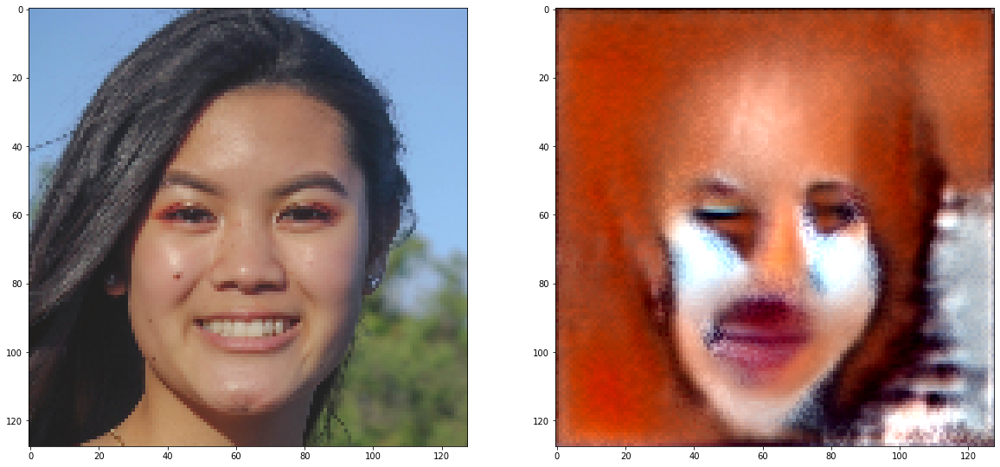

2/6, ITERATION 1000 gen_loss: 3.667331 disc_loss: 1.104789


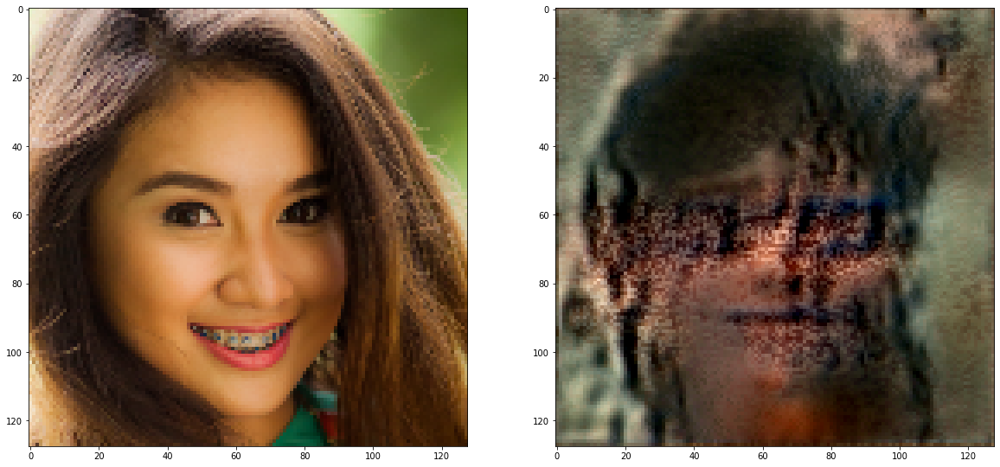

2/6, ITERATION 1100 gen_loss: 3.591578 disc_loss: 1.114374


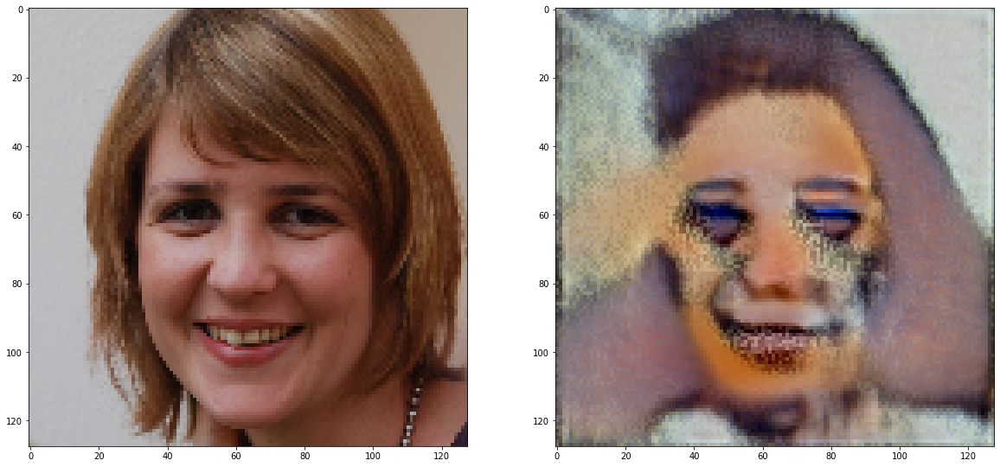

2/6, ITERATION 1200 gen_loss: 3.525023 disc_loss: 1.12037


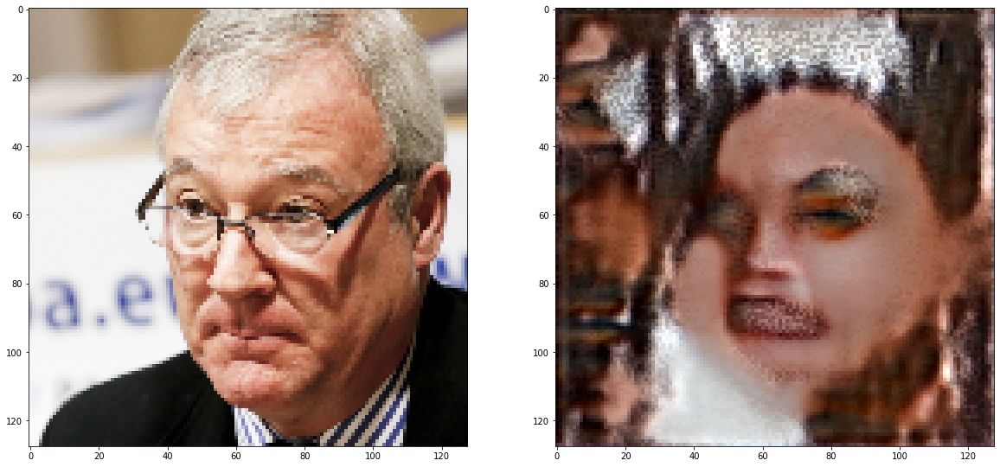

2/6, ITERATION 1300 gen_loss: 3.438616 disc_loss: 1.137567


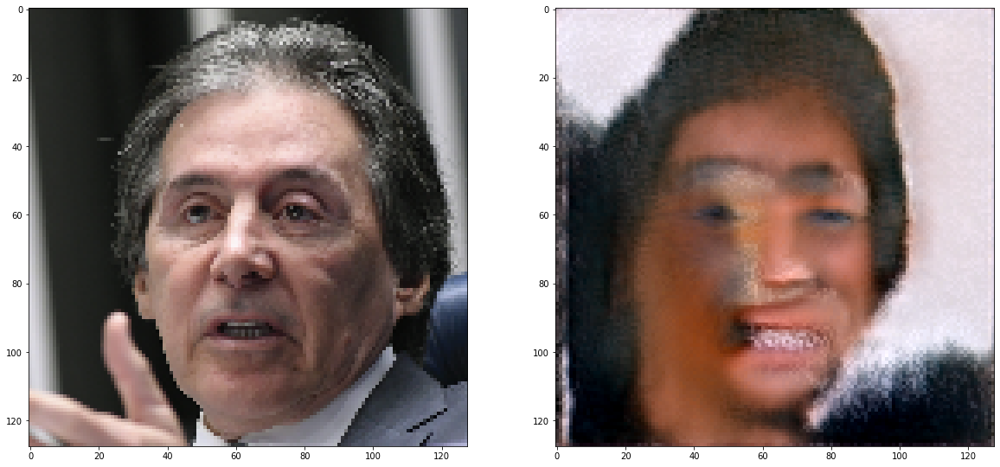

2/6, ITERATION 1400 gen_loss: 3.390637 disc_loss: 1.141923


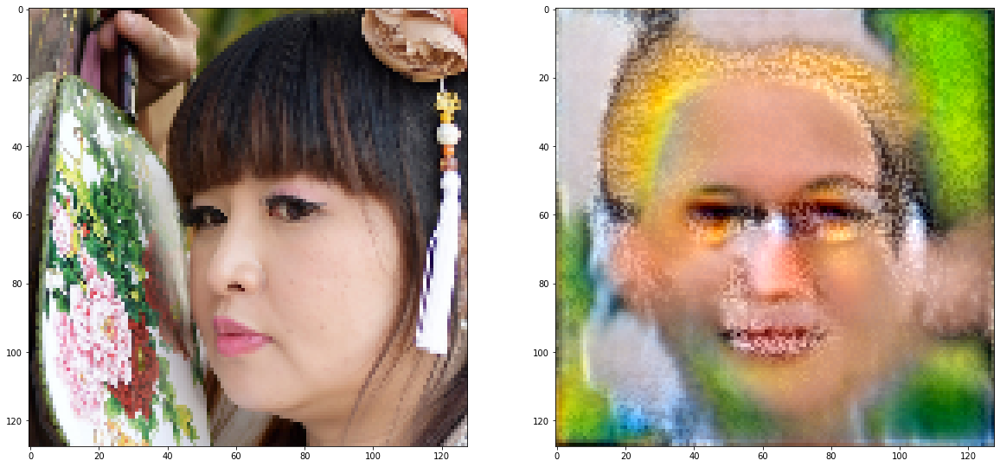

2/6, ITERATION 1500 gen_loss: 3.454597 disc_loss: 1.133366


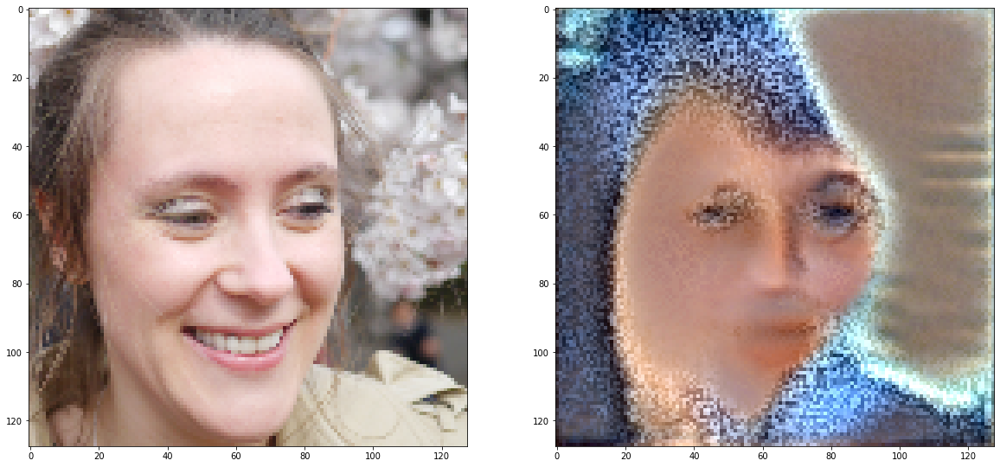

2/6, ITERATION 1600 gen_loss: 3.458629 disc_loss: 1.139733


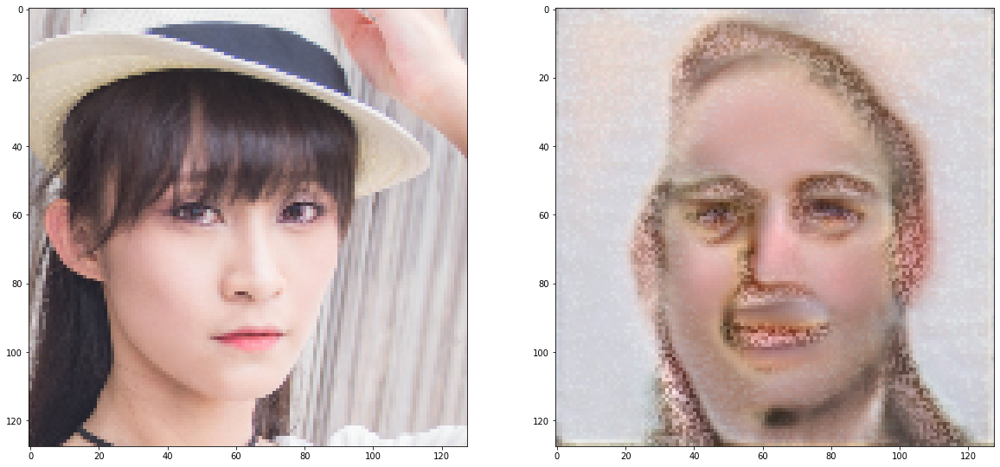

2/6, ITERATION 1700 gen_loss: 3.502476 disc_loss: 1.138695


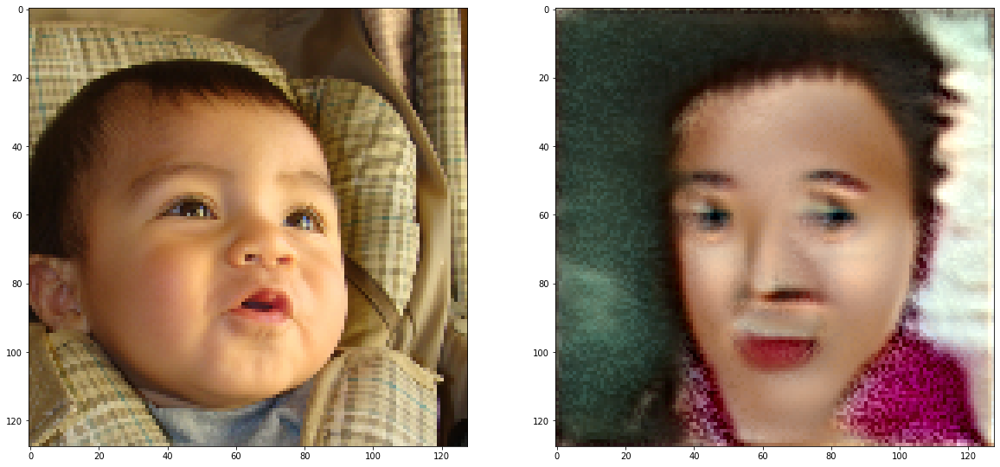

2/6, ITERATION 1800 gen_loss: 3.4619 disc_loss: 1.153277


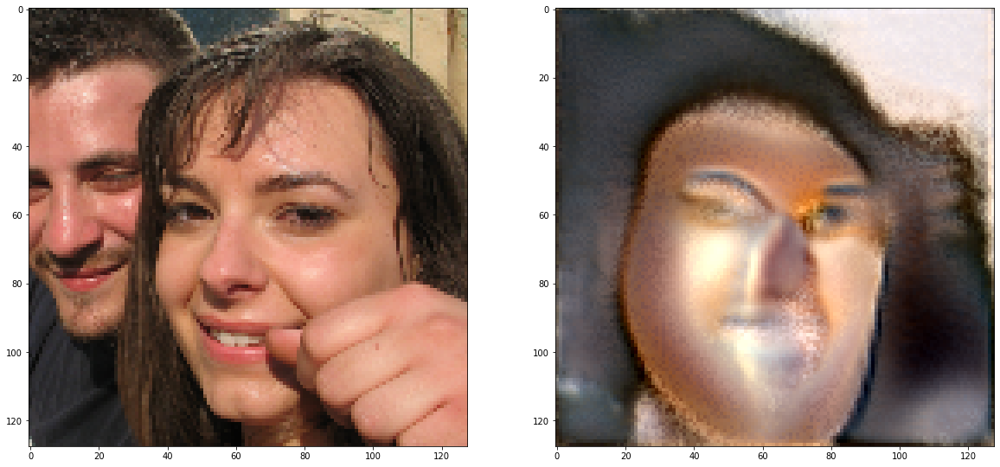

2/6, ITERATION 1900 gen_loss: 3.498145 disc_loss: 1.143329


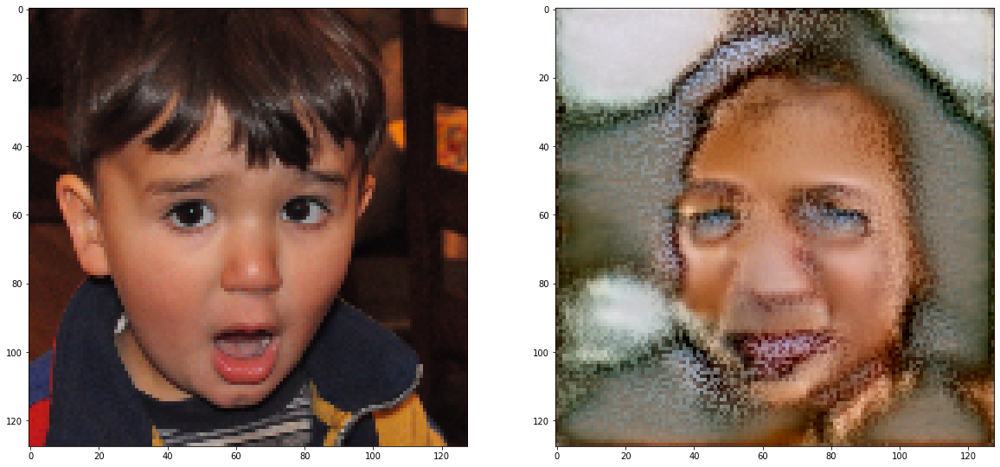

2/6, ITERATION 2000 gen_loss: 3.745371 disc_loss: 1.172935


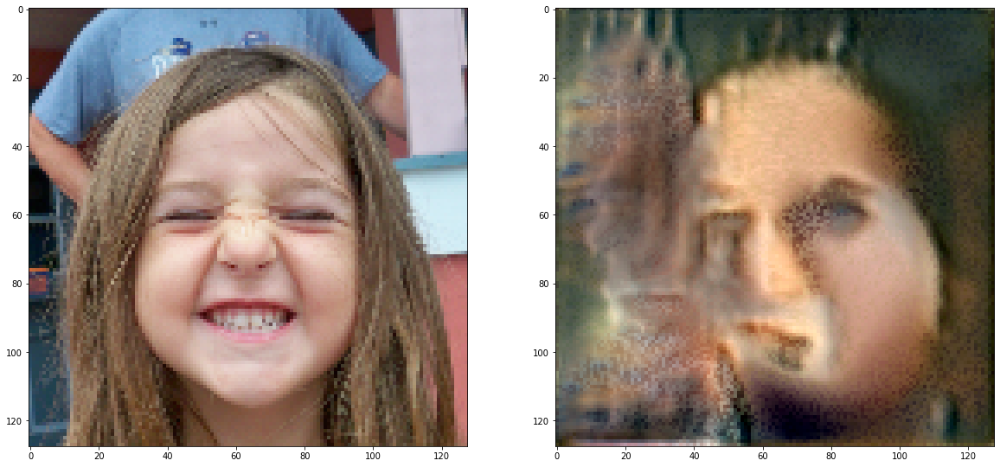

2/6, ITERATION 2100 gen_loss: 3.701534 disc_loss: 1.175155


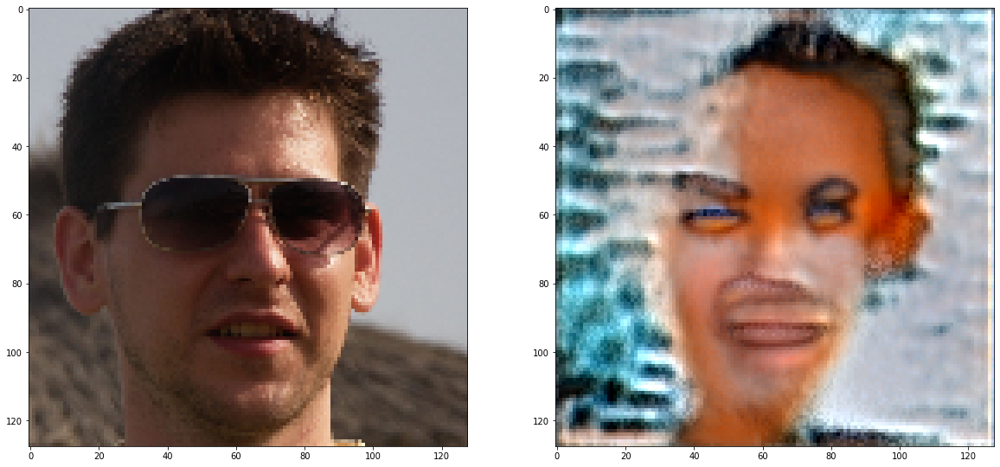

2/6, ITERATION 2200 gen_loss: 3.843655 disc_loss: 1.175872


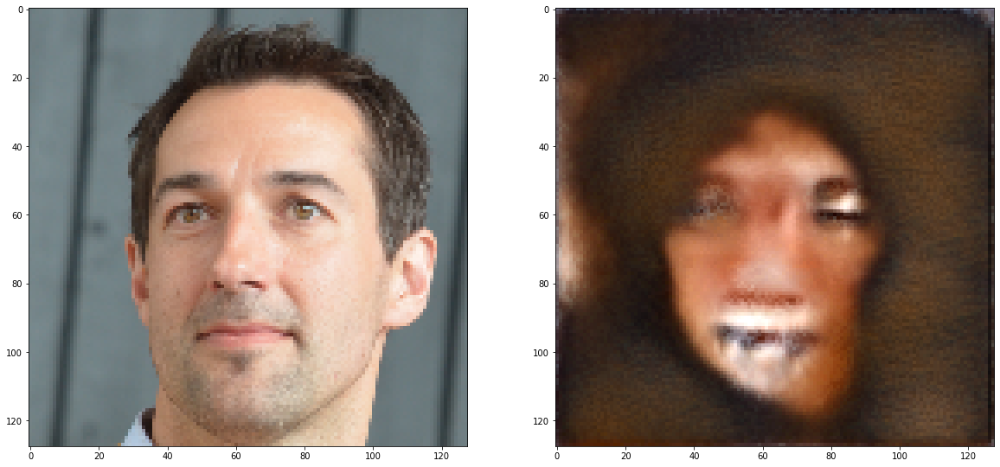

2/6, ITERATION 2300 gen_loss: 3.793647 disc_loss: 1.172372


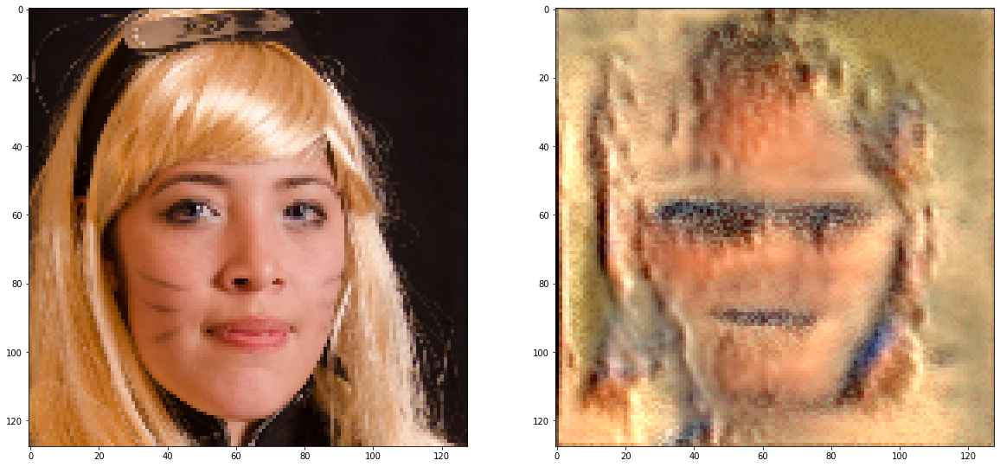

  0%|          | 0/2363 [00:00<?, ?it/s]

3/6, ITERATION 100 gen_loss: 3.220069 disc_loss: 1.07176


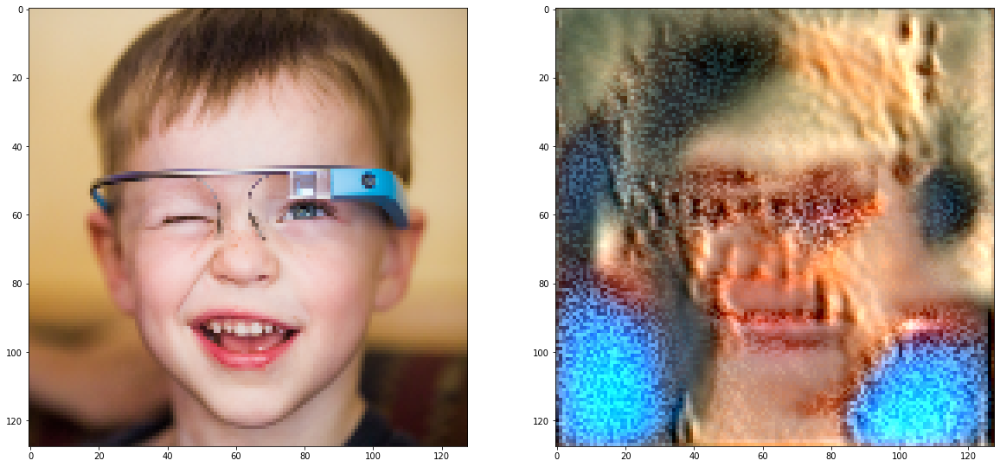

3/6, ITERATION 200 gen_loss: 3.126246 disc_loss: 1.109282


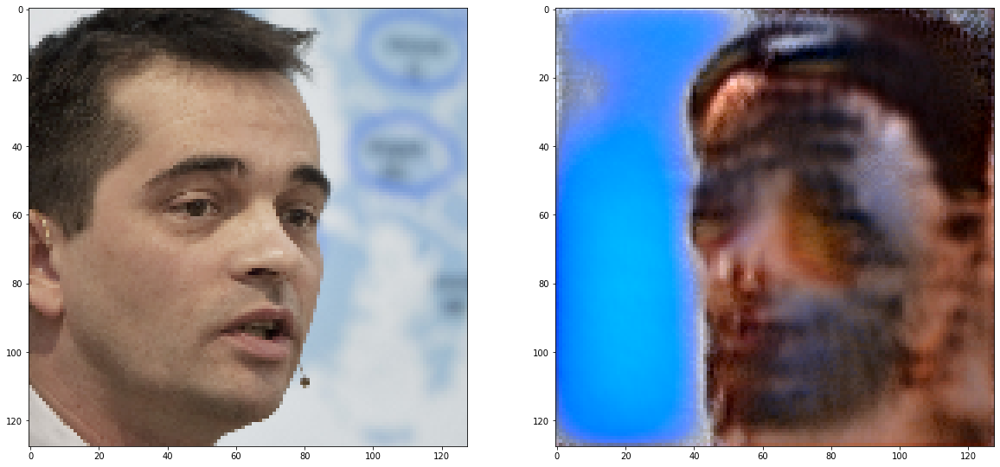

3/6, ITERATION 300 gen_loss: 3.304086 disc_loss: 1.155422


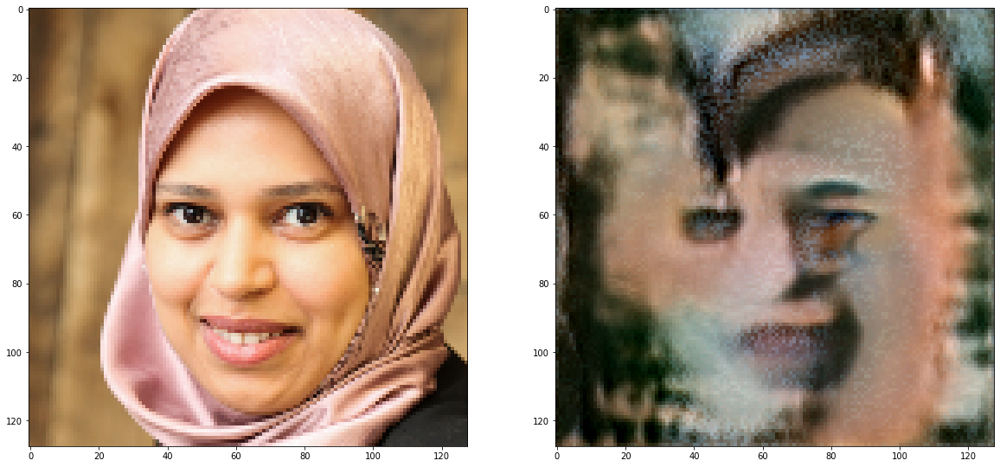

3/6, ITERATION 400 gen_loss: 3.346861 disc_loss: 1.135905


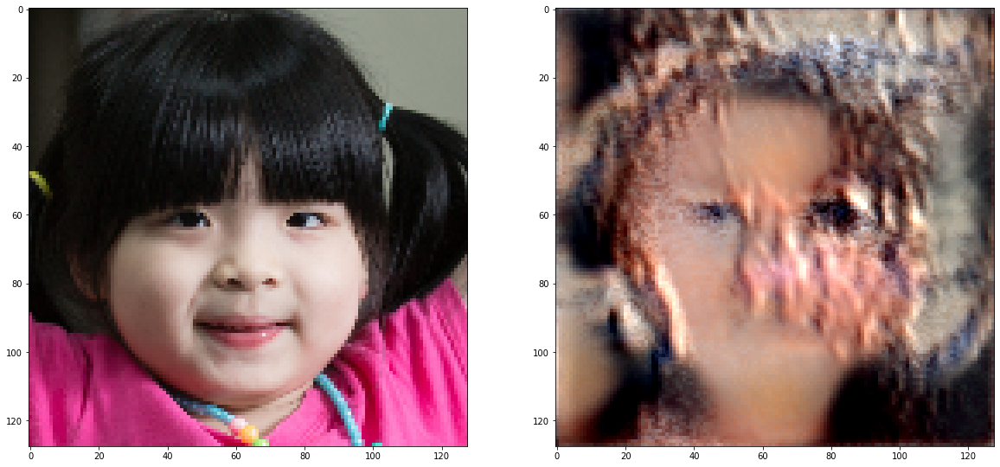

3/6, ITERATION 500 gen_loss: 3.430236 disc_loss: 1.127749


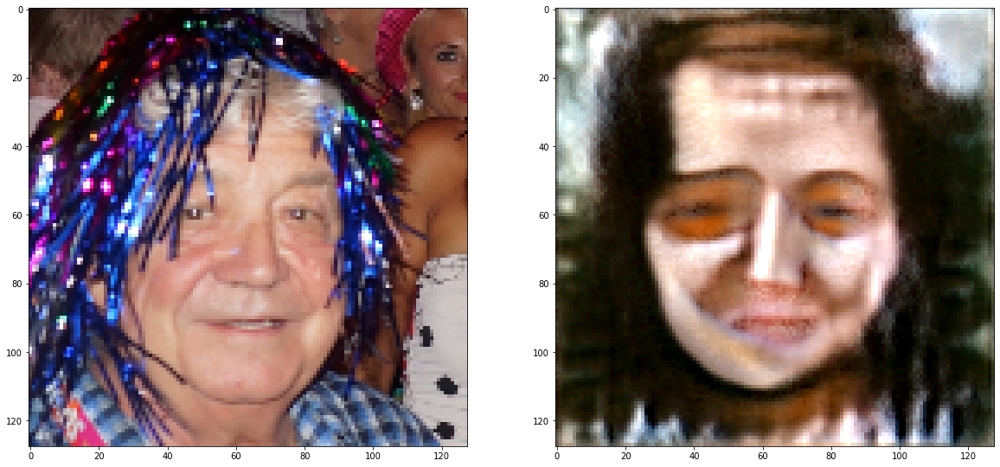

3/6, ITERATION 600 gen_loss: 3.343455 disc_loss: 1.169985


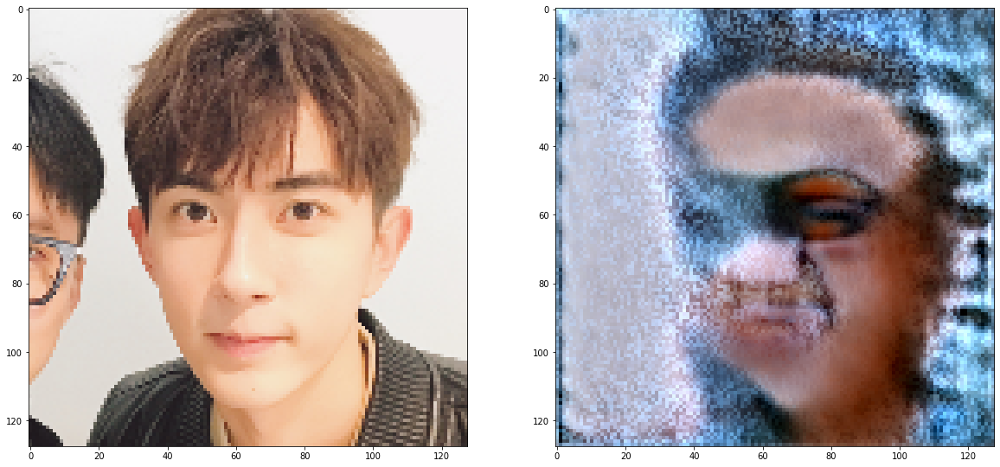

3/6, ITERATION 700 gen_loss: 3.340332 disc_loss: 1.146749


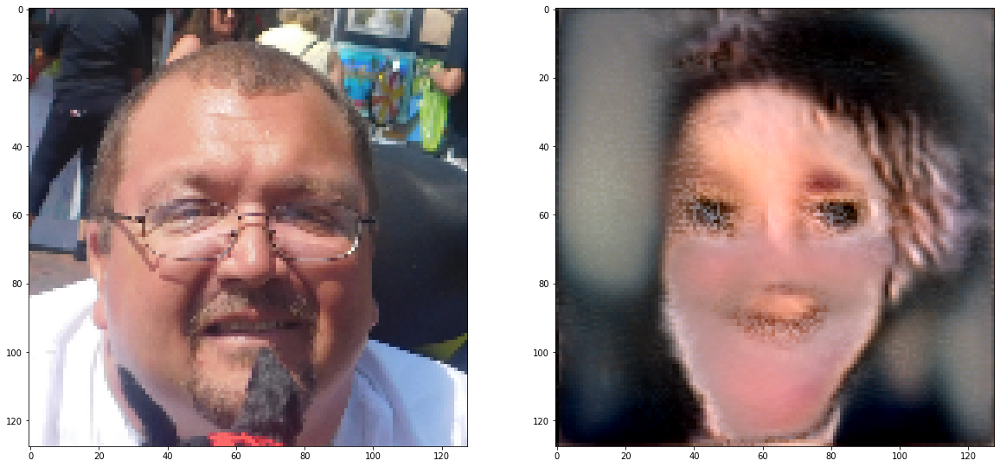

3/6, ITERATION 800 gen_loss: 3.414864 disc_loss: 1.167452


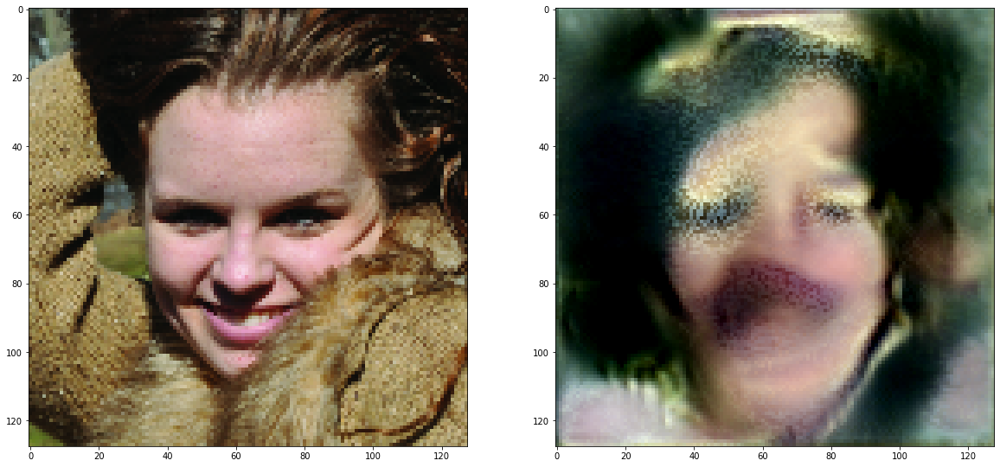

3/6, ITERATION 900 gen_loss: 3.38361 disc_loss: 1.17219


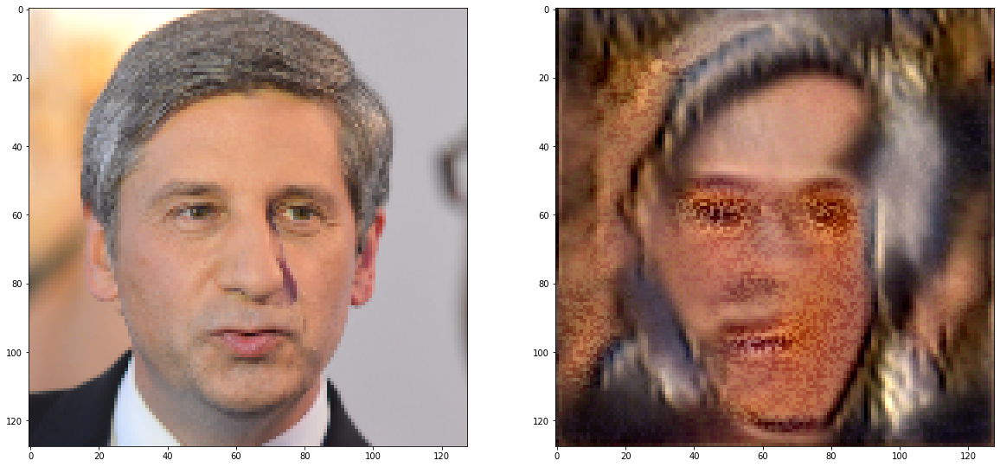

3/6, ITERATION 1000 gen_loss: 3.394915 disc_loss: 1.166647


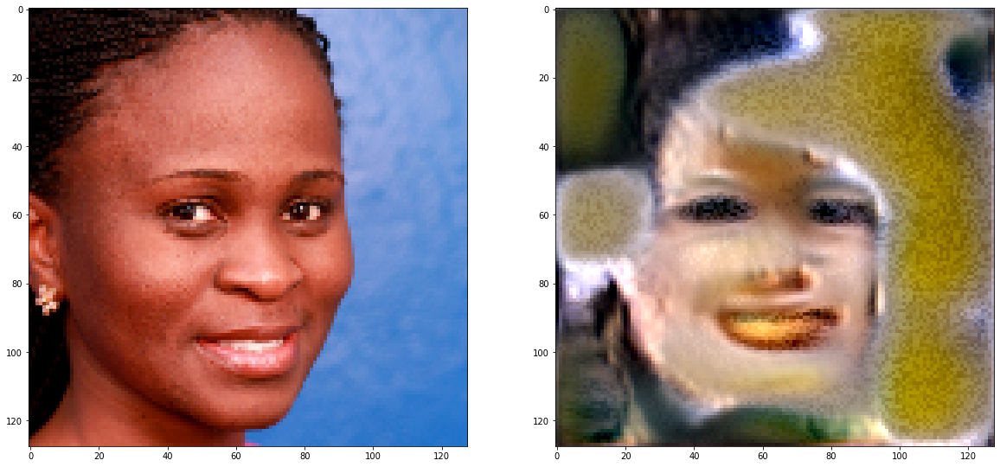

3/6, ITERATION 1100 gen_loss: 3.460155 disc_loss: 1.157632


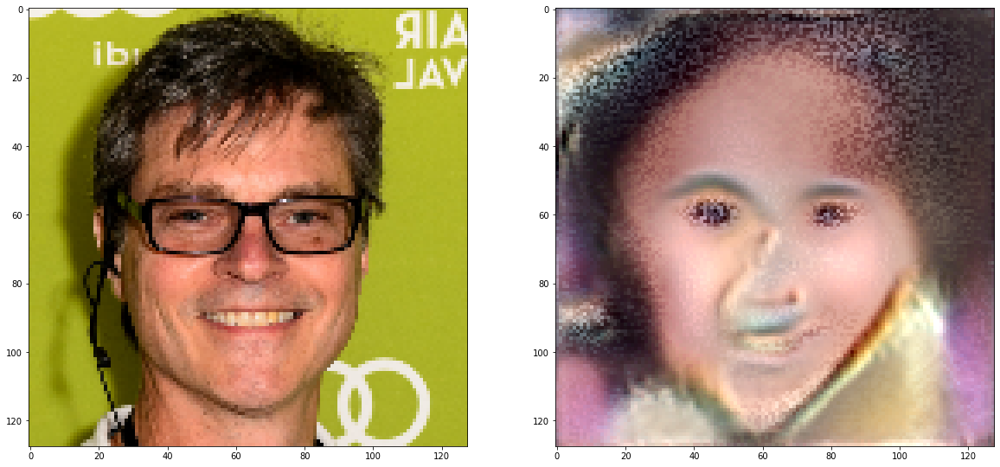

3/6, ITERATION 1200 gen_loss: 3.426598 disc_loss: 1.165963


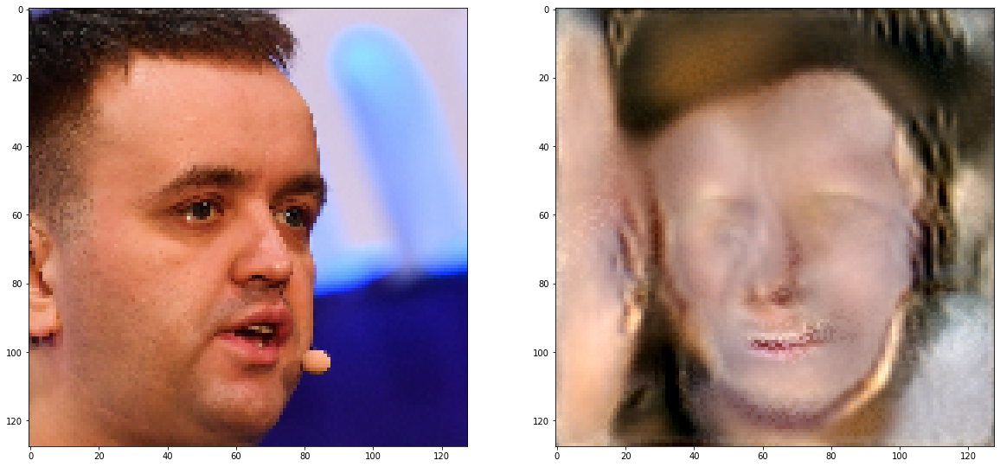

3/6, ITERATION 1300 gen_loss: 3.419634 disc_loss: 1.163547


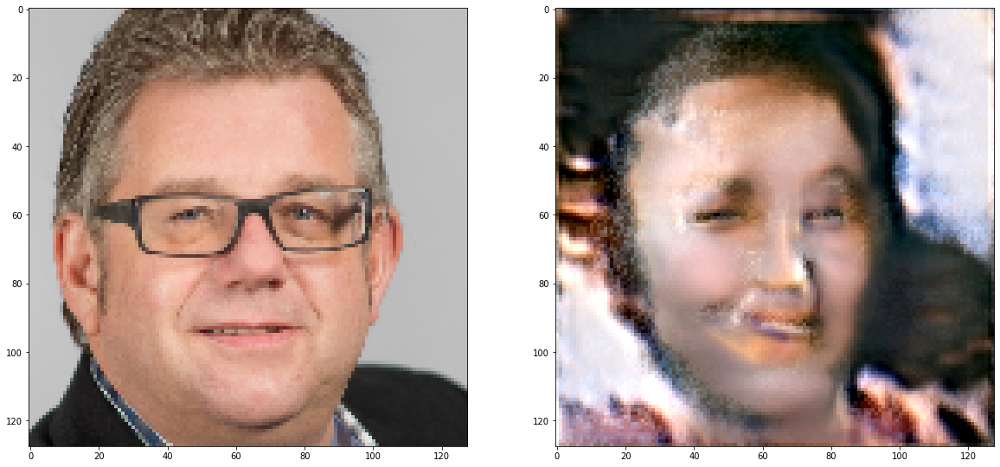

3/6, ITERATION 1400 gen_loss: 3.510026 disc_loss: 1.16015


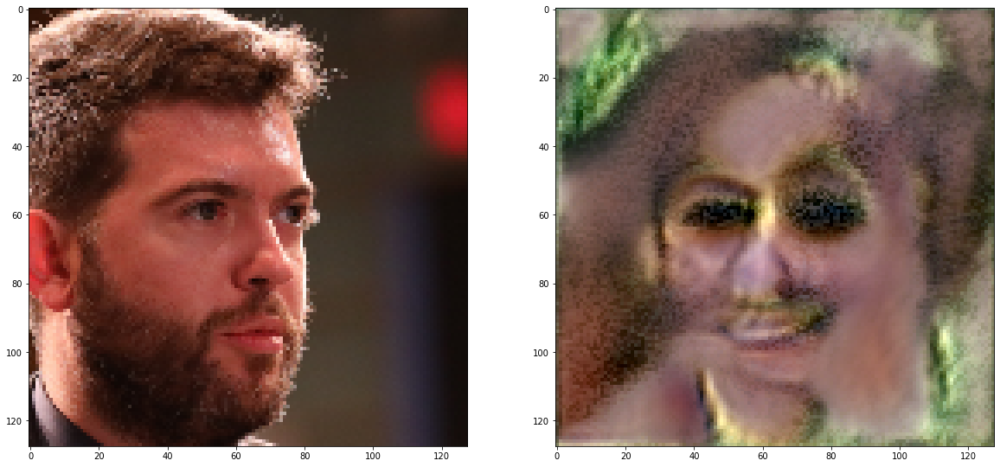

3/6, ITERATION 1500 gen_loss: 3.55332 disc_loss: 1.152203


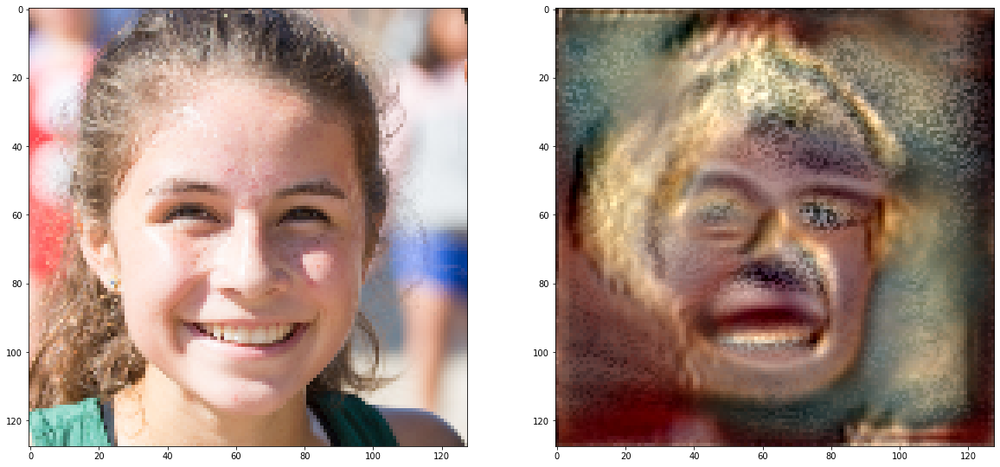

3/6, ITERATION 1600 gen_loss: 3.741836 disc_loss: 1.149233


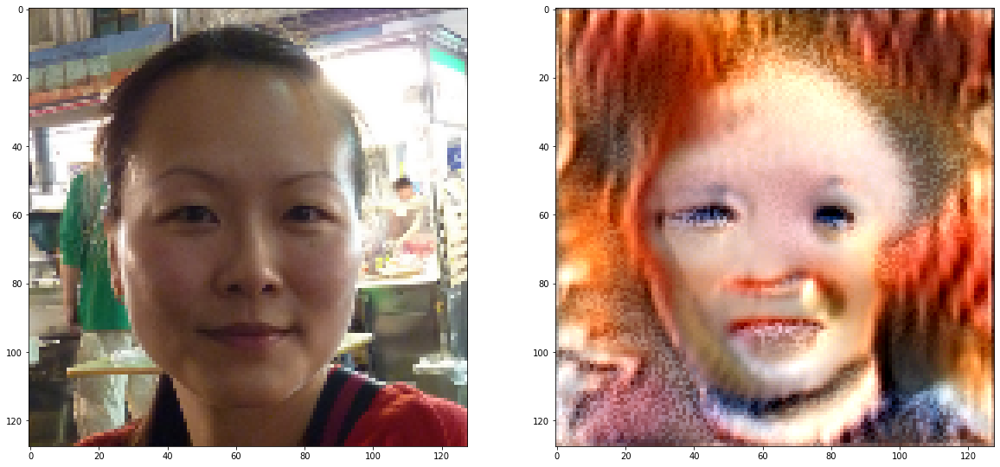

3/6, ITERATION 1700 gen_loss: 3.727297 disc_loss: 1.157839


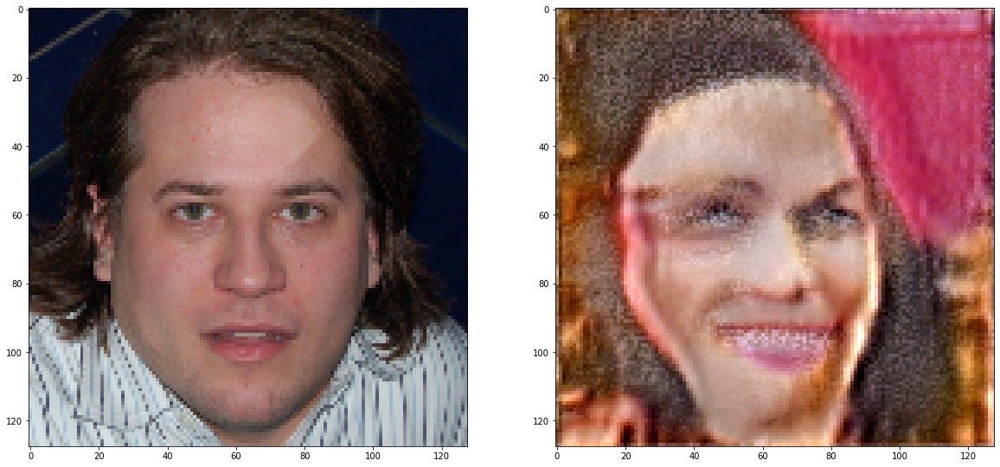

3/6, ITERATION 1800 gen_loss: 3.727398 disc_loss: 1.156088


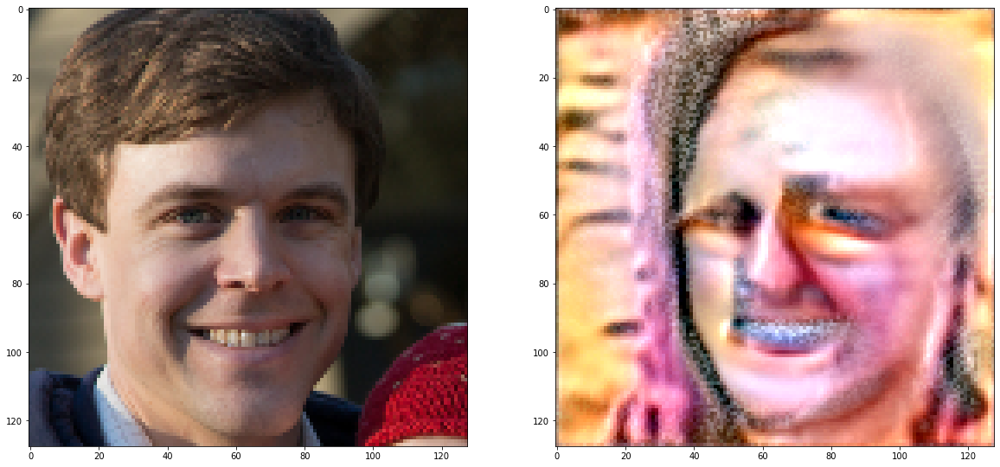

3/6, ITERATION 1900 gen_loss: 3.721432 disc_loss: 1.155873


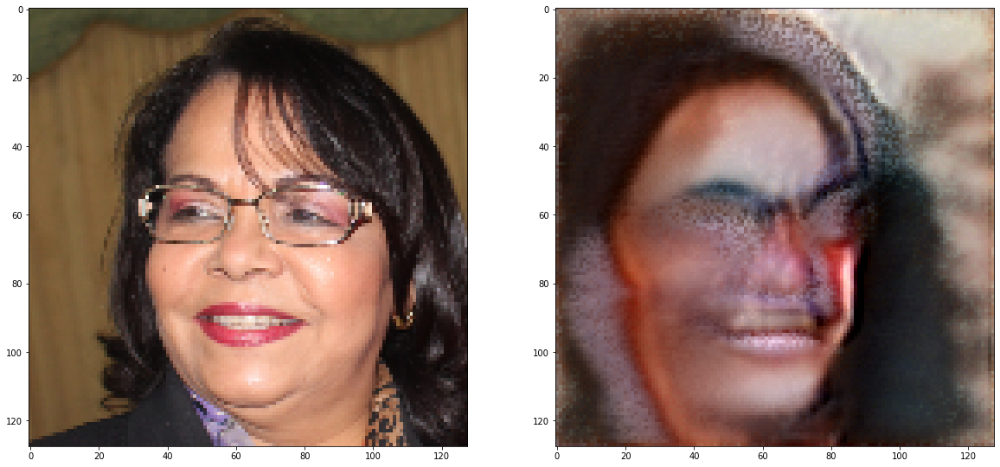

3/6, ITERATION 2000 gen_loss: 3.732123 disc_loss: 1.160062


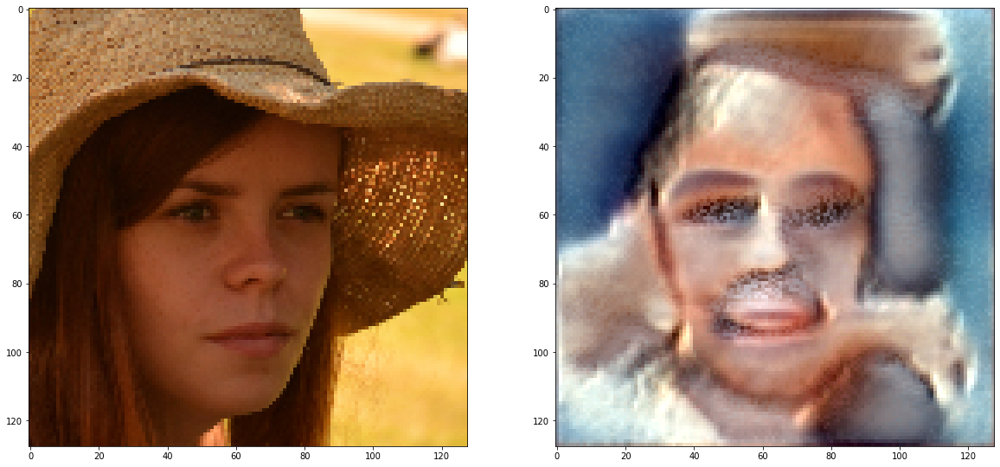

3/6, ITERATION 2100 gen_loss: 3.79813 disc_loss: 1.152356


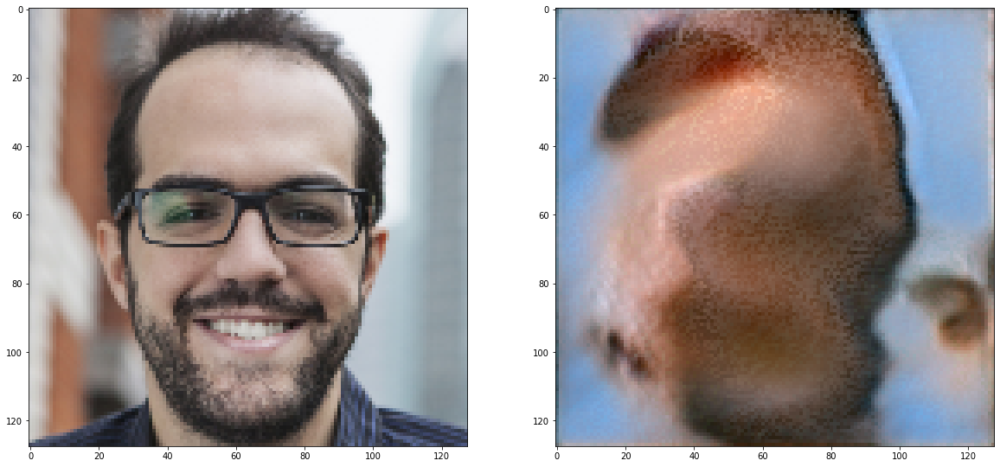

3/6, ITERATION 2200 gen_loss: 3.775046 disc_loss: 1.159107


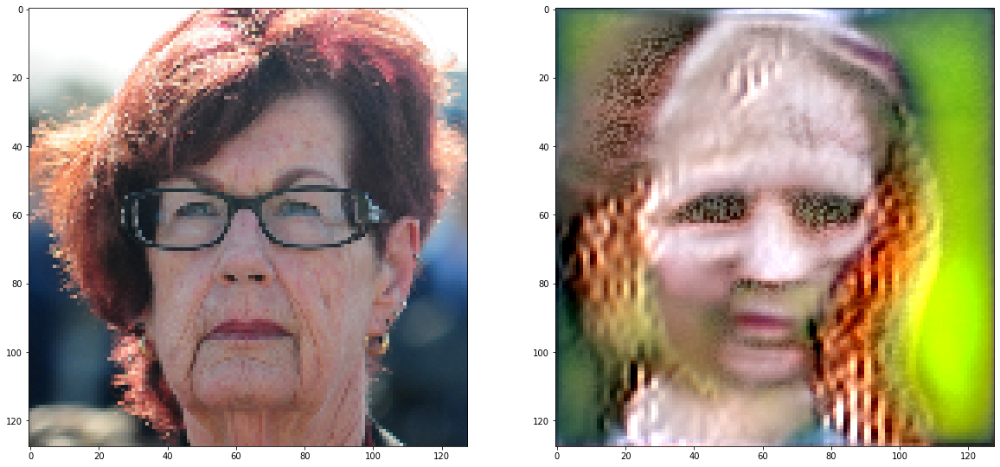

3/6, ITERATION 2300 gen_loss: 3.732211 disc_loss: 1.164578


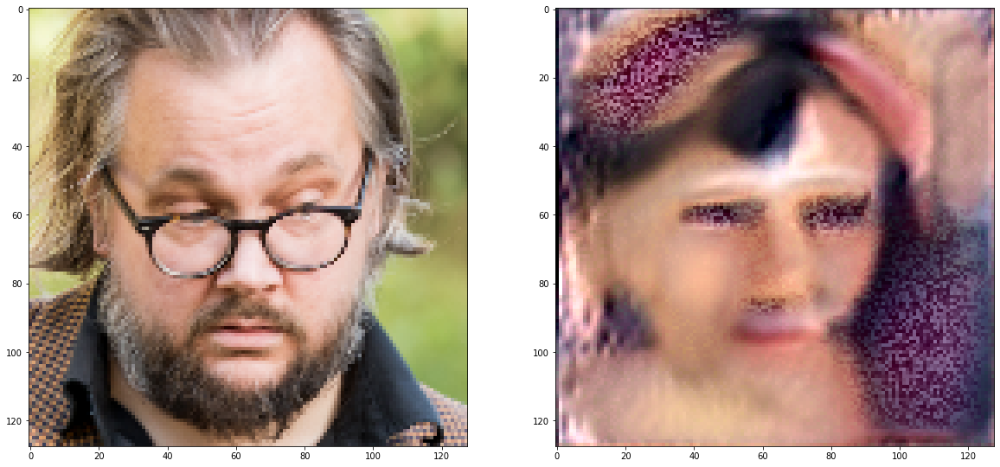

  0%|          | 0/2363 [00:00<?, ?it/s]

4/6, ITERATION 100 gen_loss: 2.745668 disc_loss: 1.216721


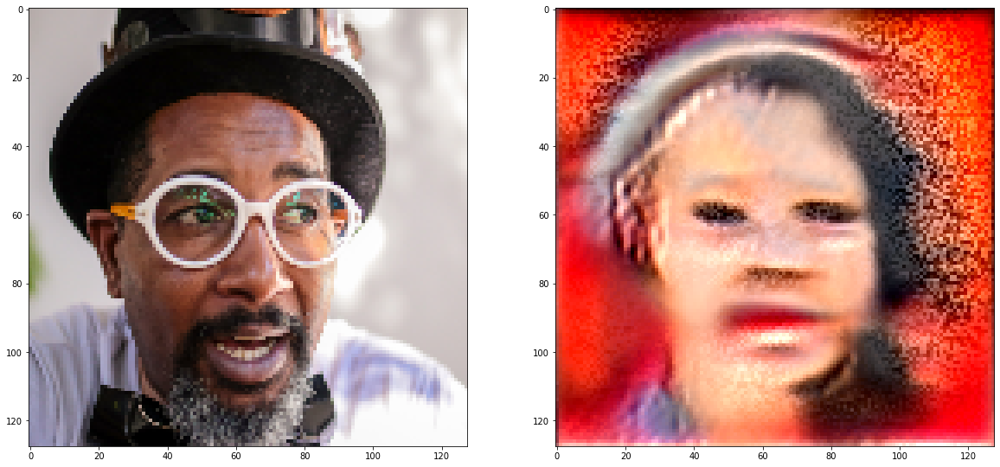

4/6, ITERATION 200 gen_loss: 2.784098 disc_loss: 1.217165


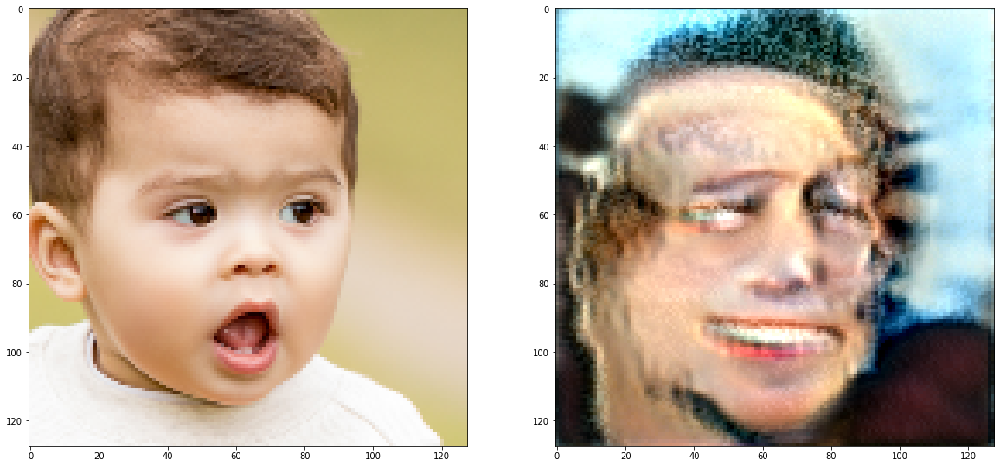

4/6, ITERATION 300 gen_loss: 3.070964 disc_loss: 1.1846


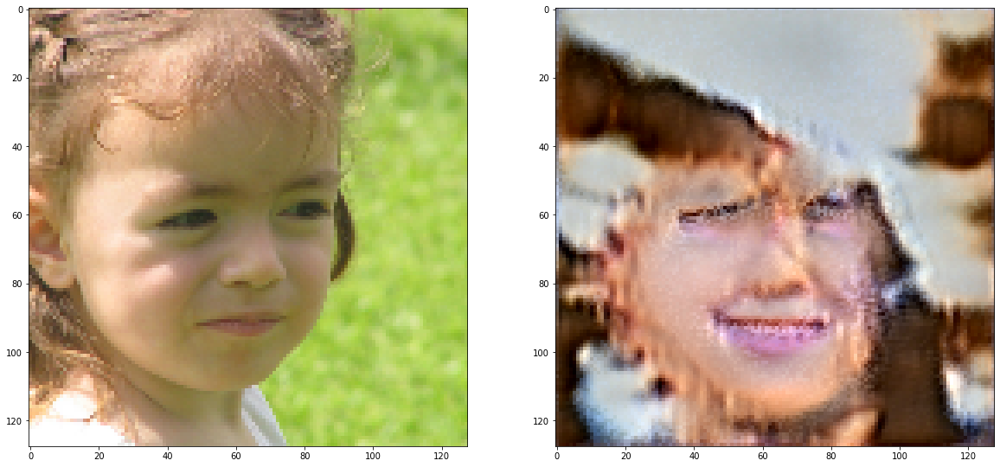

4/6, ITERATION 400 gen_loss: 3.12925 disc_loss: 1.168081


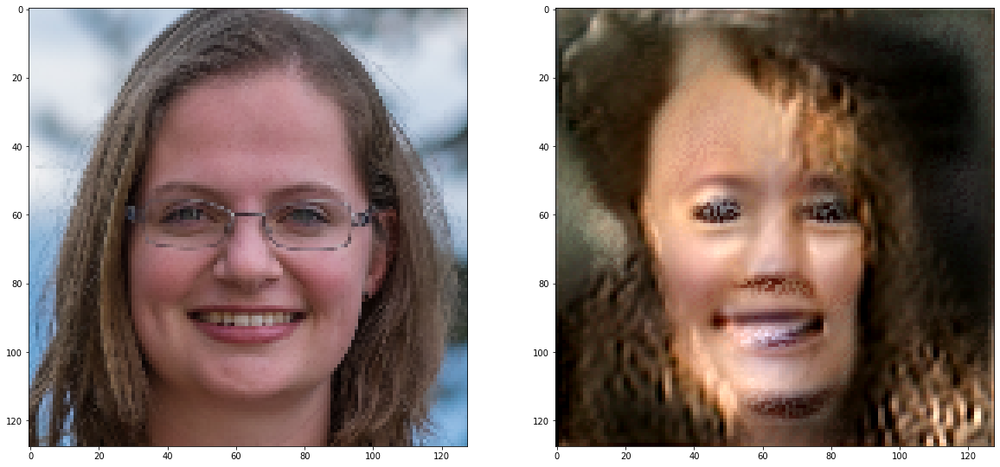

4/6, ITERATION 500 gen_loss: 3.118994 disc_loss: 1.160307


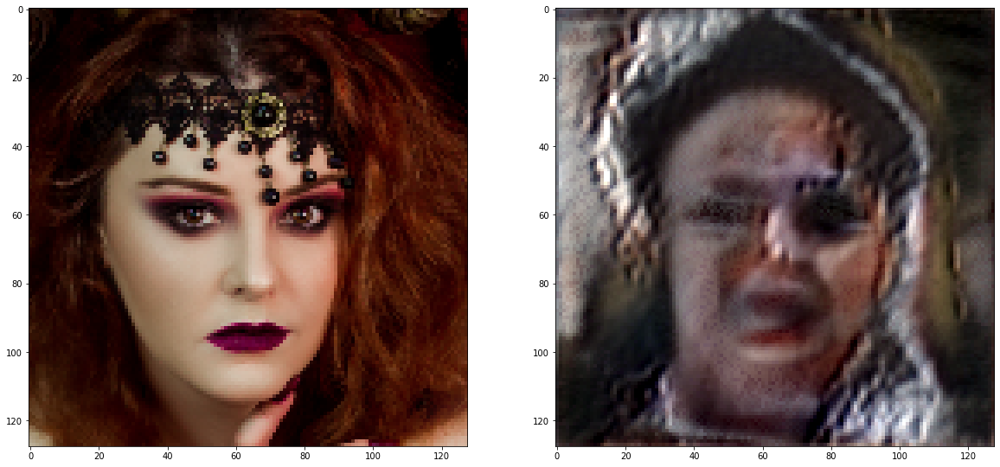

4/6, ITERATION 600 gen_loss: 3.165858 disc_loss: 1.166309


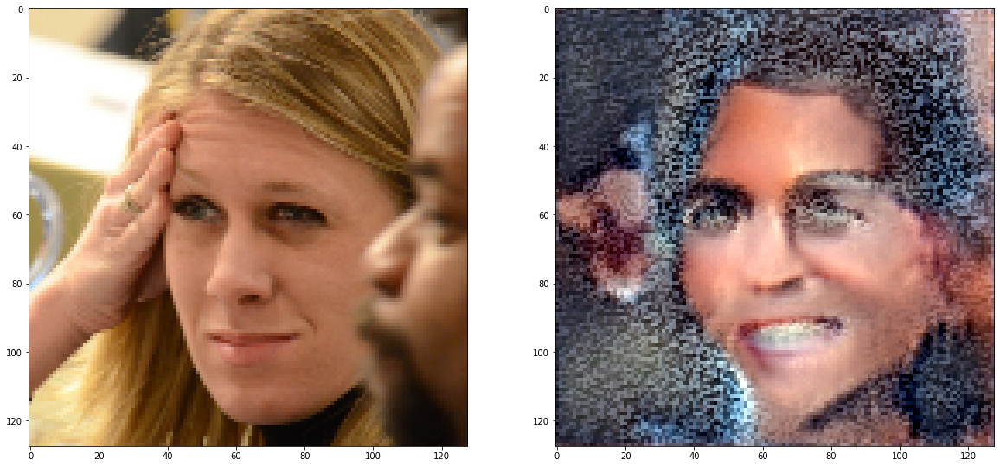

4/6, ITERATION 700 gen_loss: 3.207795 disc_loss: 1.153324


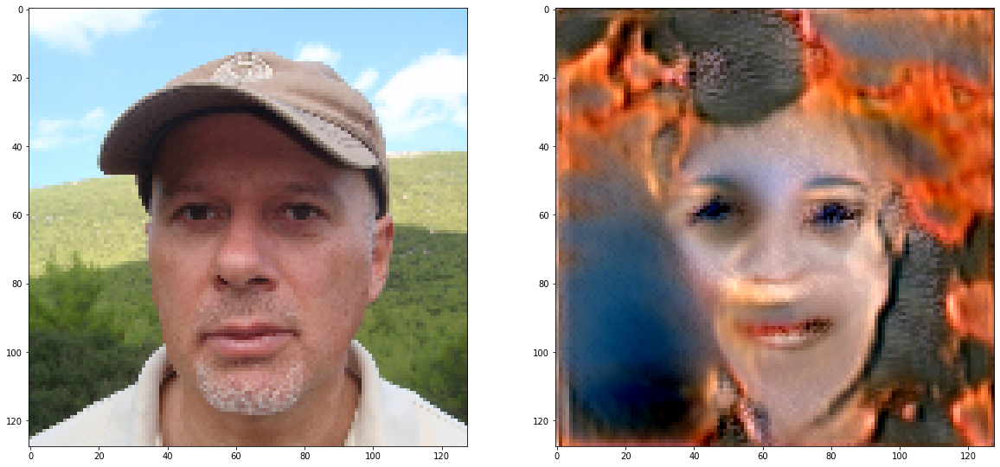

4/6, ITERATION 800 gen_loss: 3.27017 disc_loss: 1.154616


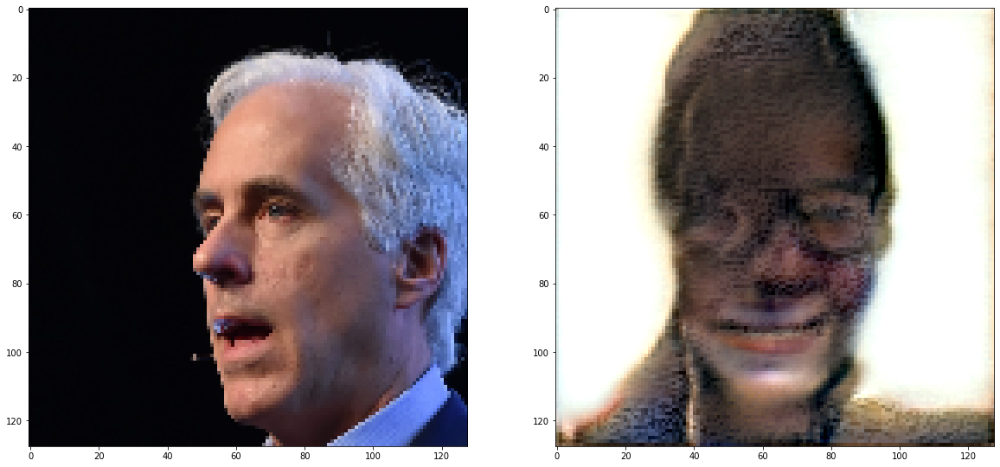

4/6, ITERATION 900 gen_loss: 3.266703 disc_loss: 1.154225


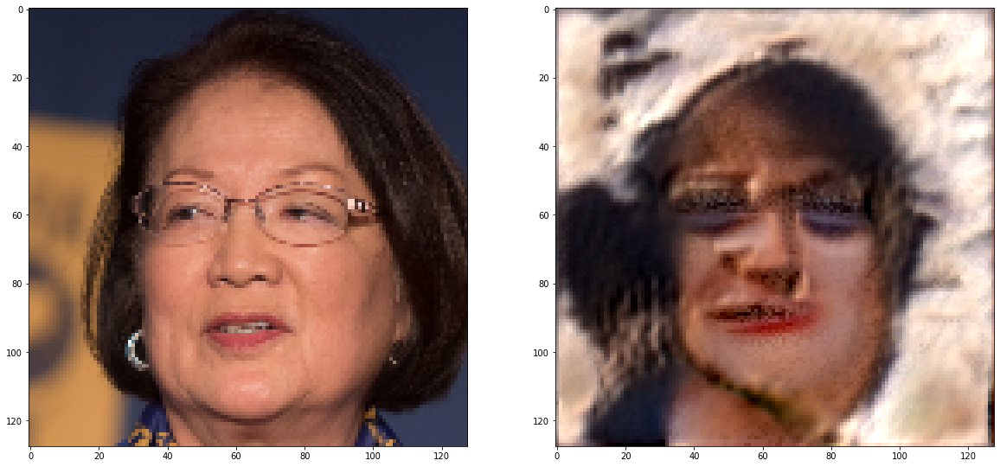

4/6, ITERATION 1000 gen_loss: 3.269245 disc_loss: 1.166171


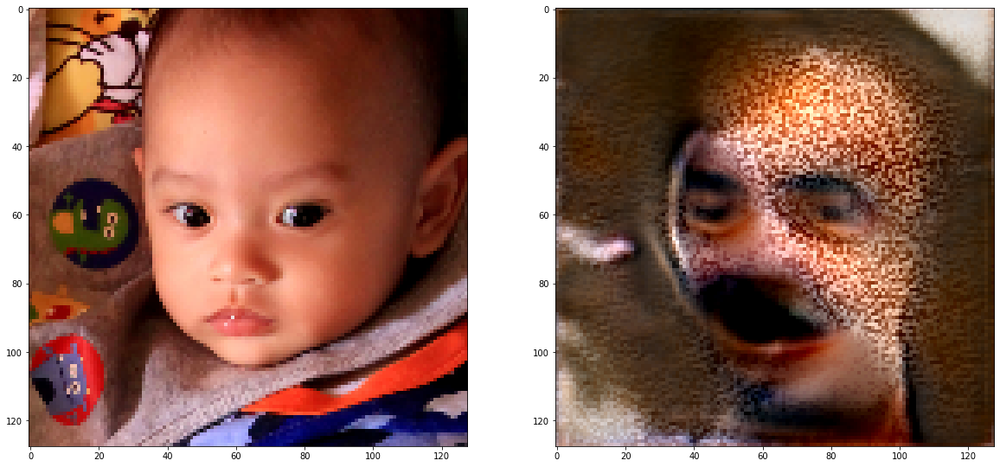

4/6, ITERATION 1100 gen_loss: 3.32387 disc_loss: 1.156209


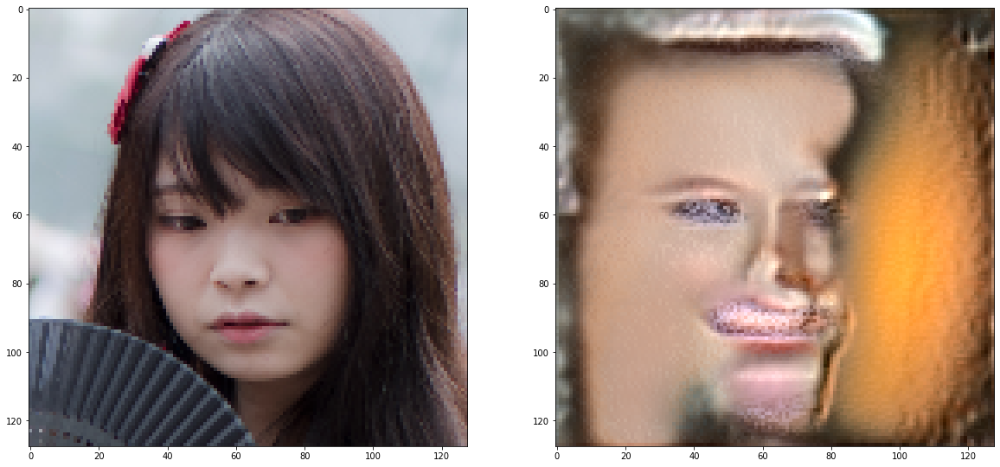

4/6, ITERATION 1200 gen_loss: 3.376476 disc_loss: 1.159149


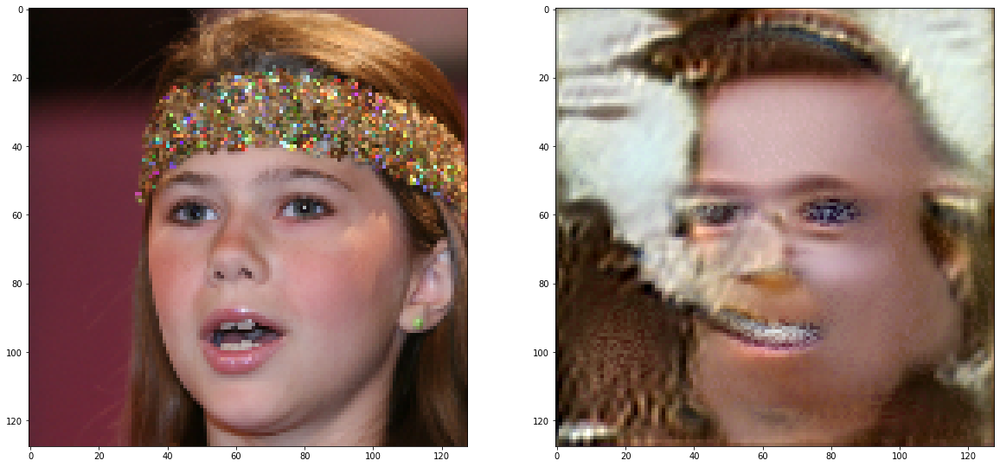

4/6, ITERATION 1300 gen_loss: 3.423769 disc_loss: 1.163911


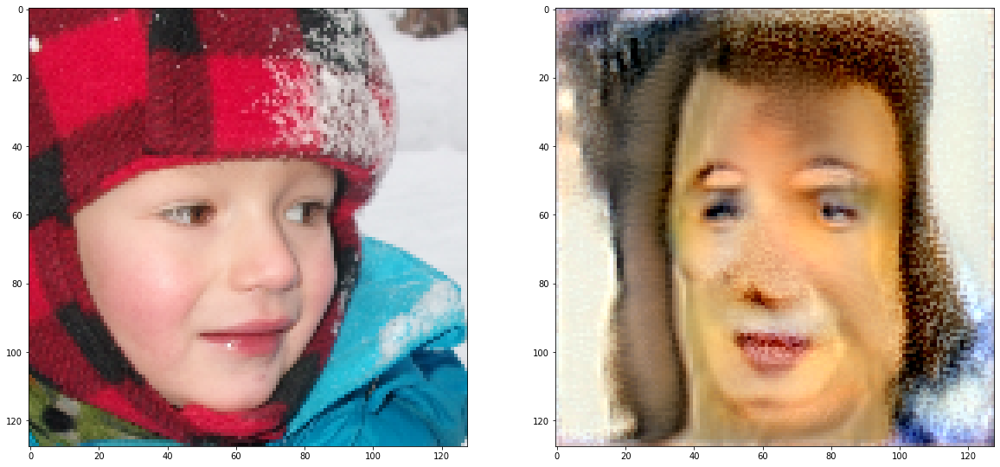

4/6, ITERATION 1400 gen_loss: 3.491498 disc_loss: 1.160988


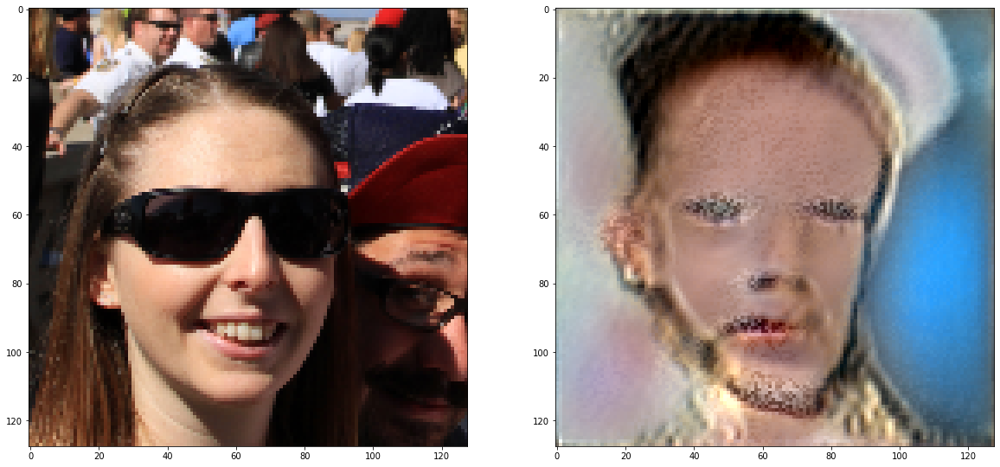

4/6, ITERATION 1500 gen_loss: 3.463475 disc_loss: 1.163026


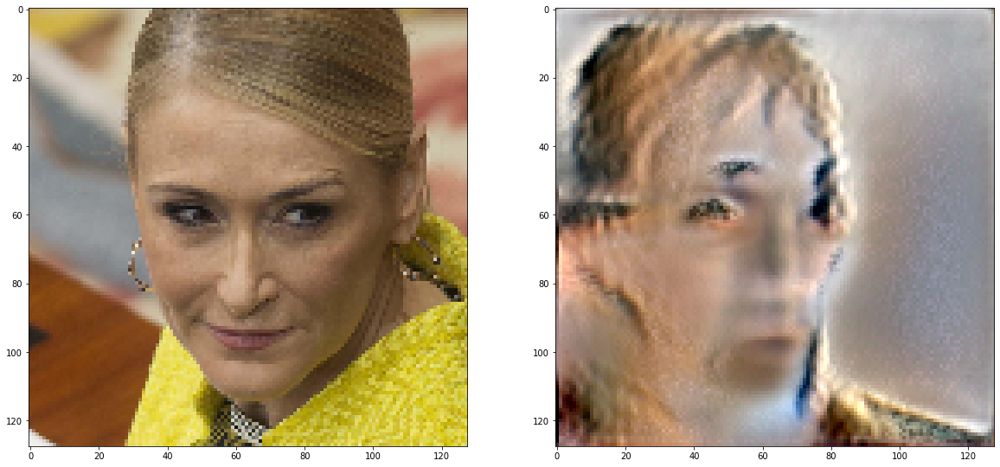

4/6, ITERATION 1600 gen_loss: 3.627493 disc_loss: 1.146031


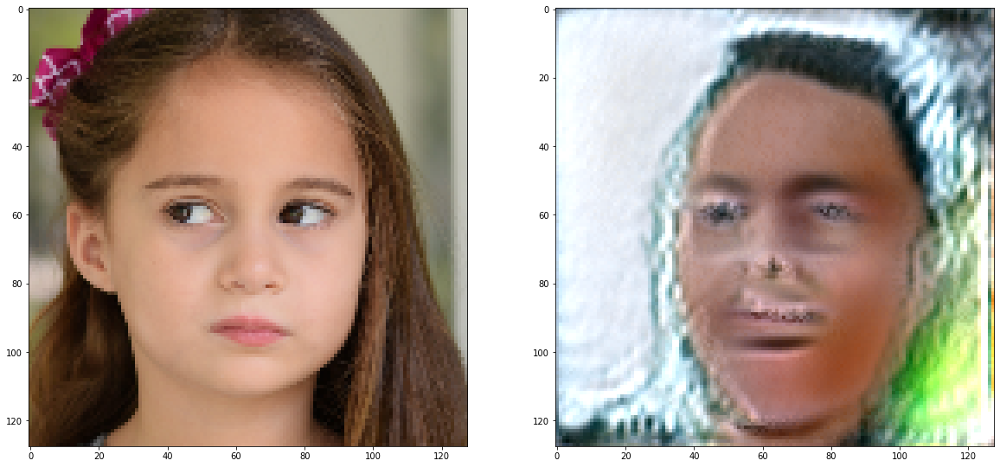

4/6, ITERATION 1700 gen_loss: 3.712827 disc_loss: 1.144949


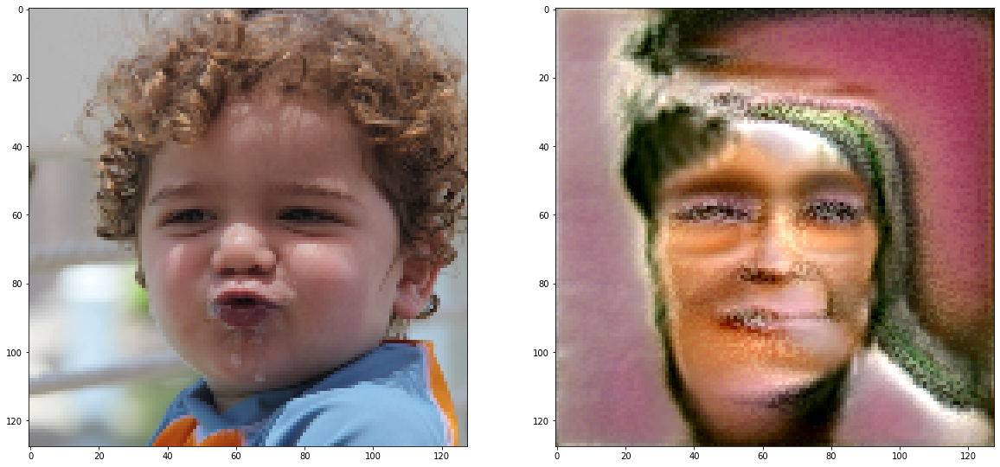

4/6, ITERATION 1800 gen_loss: 3.745531 disc_loss: 1.146057


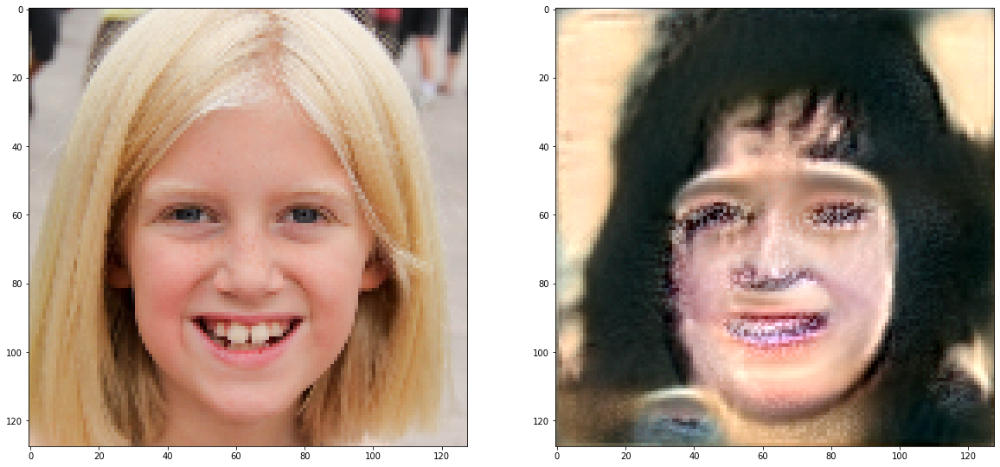

4/6, ITERATION 1900 gen_loss: 3.748564 disc_loss: 1.142602


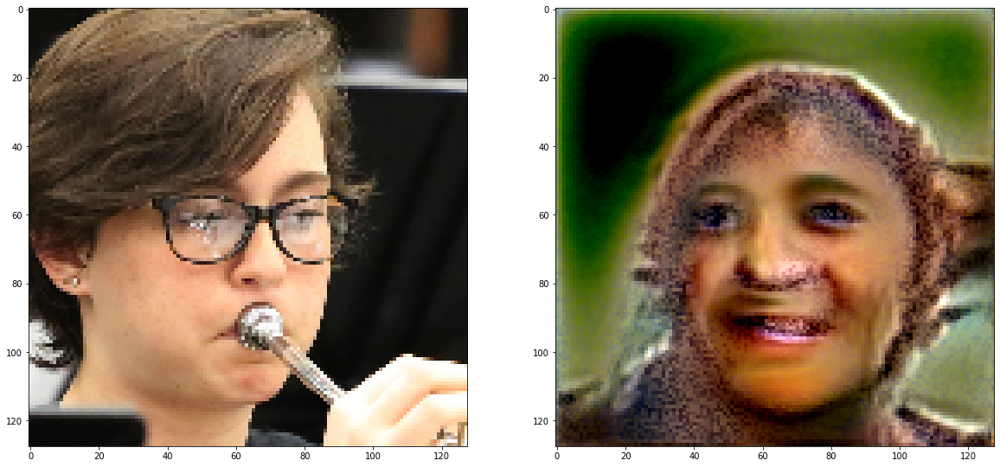

4/6, ITERATION 2000 gen_loss: 3.879592 disc_loss: 1.14442


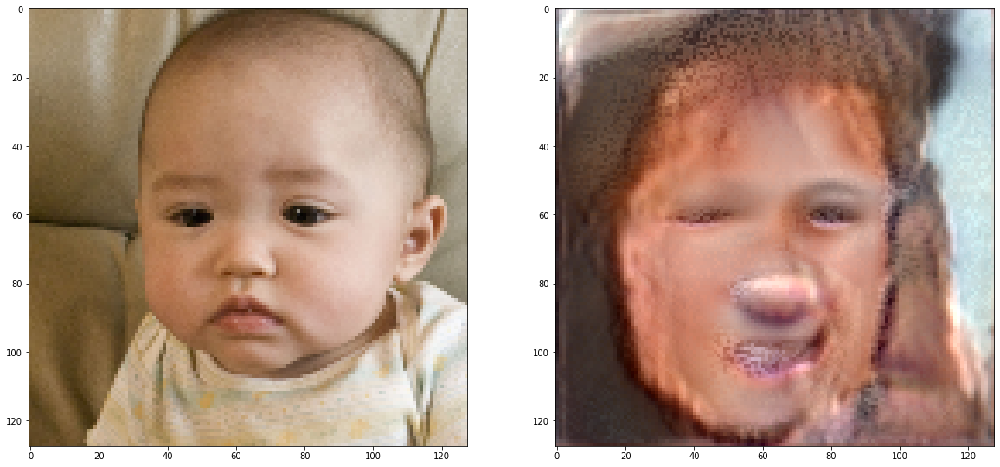

4/6, ITERATION 2100 gen_loss: 4.012049 disc_loss: 1.130908


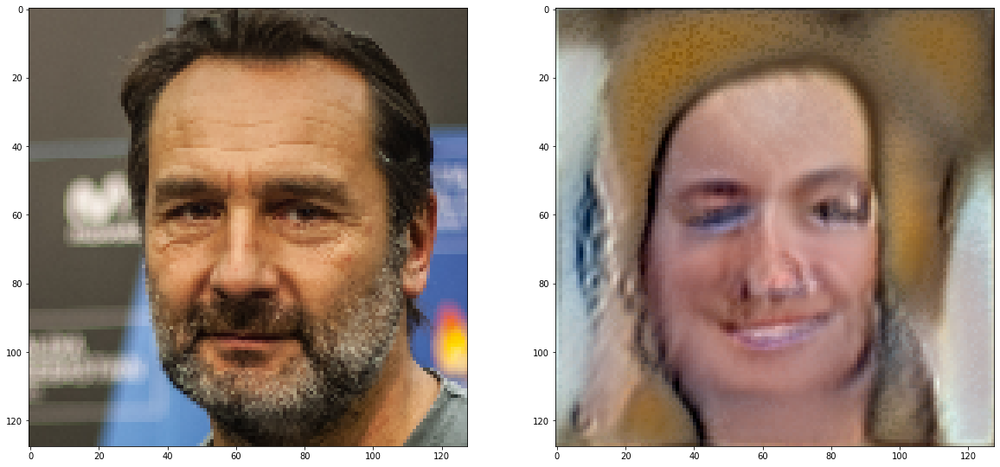

4/6, ITERATION 2200 gen_loss: 4.102515 disc_loss: 1.131685


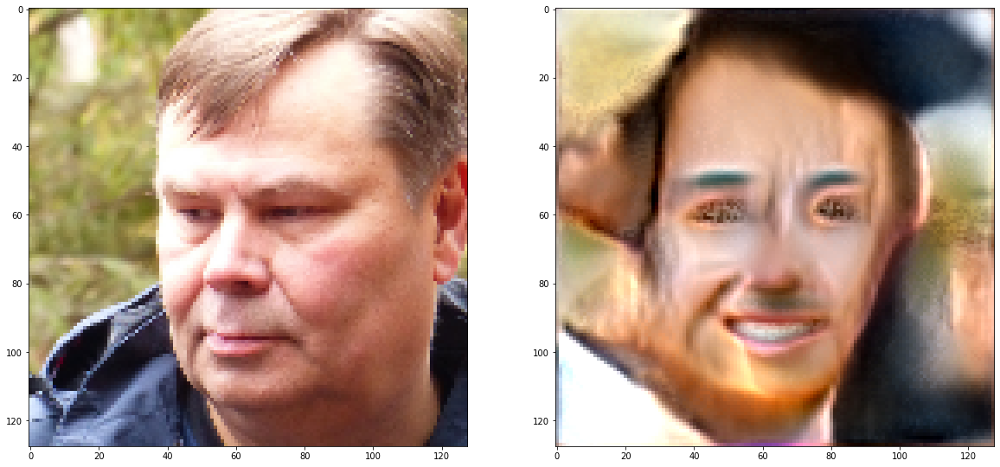

4/6, ITERATION 2300 gen_loss: 4.116261 disc_loss: 1.131858


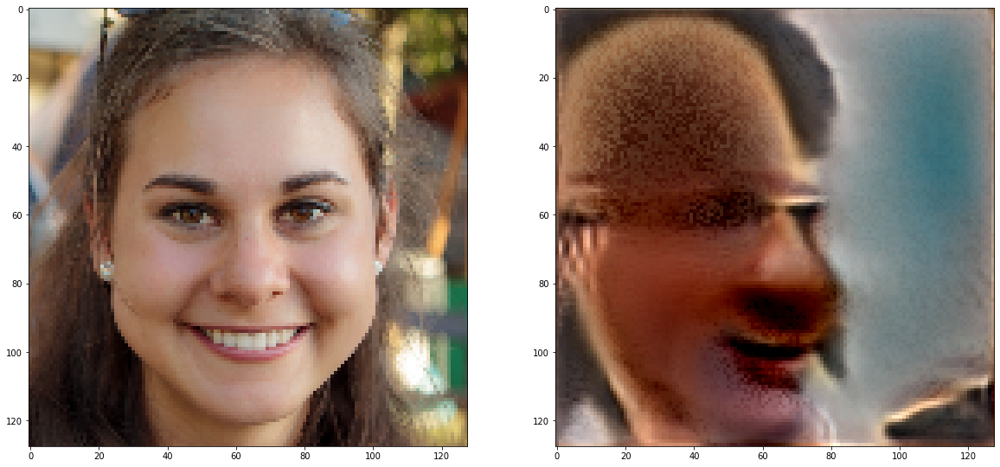

  0%|          | 0/2363 [00:00<?, ?it/s]

5/6, ITERATION 100 gen_loss: 4.78065 disc_loss: 1.105844


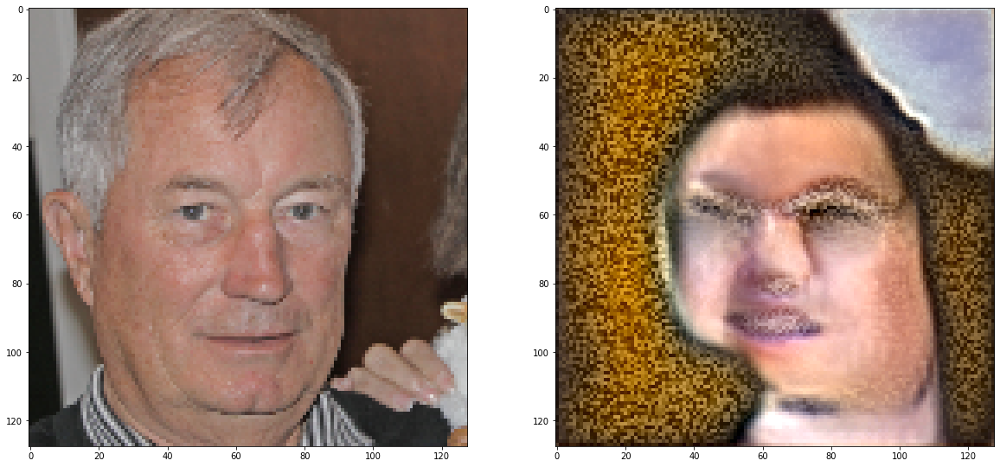

5/6, ITERATION 200 gen_loss: 4.453567 disc_loss: 1.037755


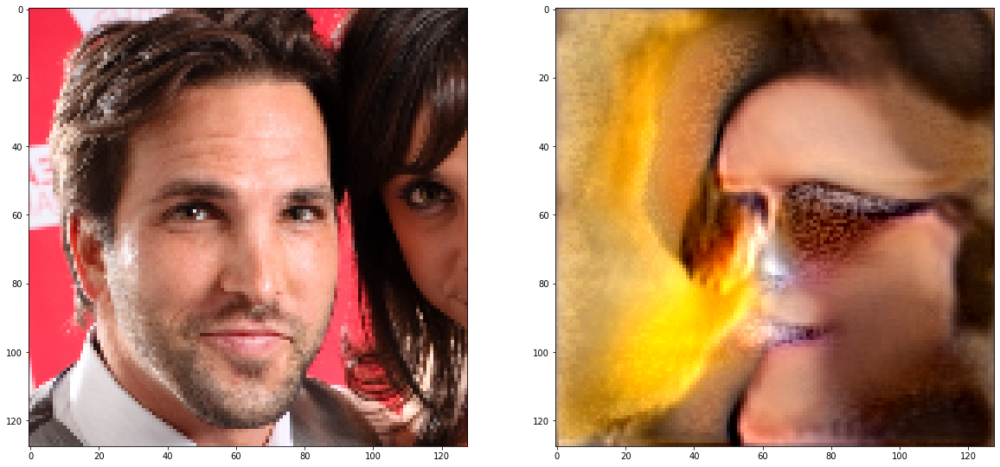

5/6, ITERATION 300 gen_loss: 4.147026 disc_loss: 1.097005


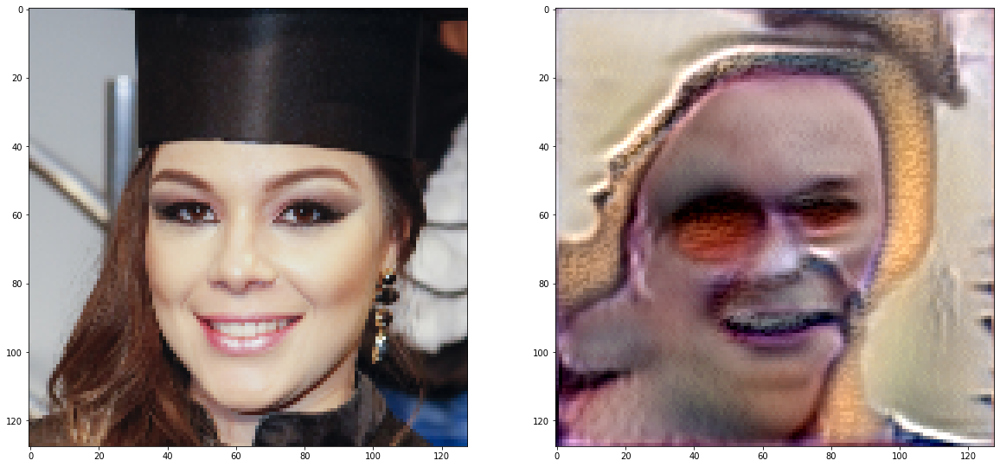

5/6, ITERATION 400 gen_loss: 3.942999 disc_loss: 1.116687


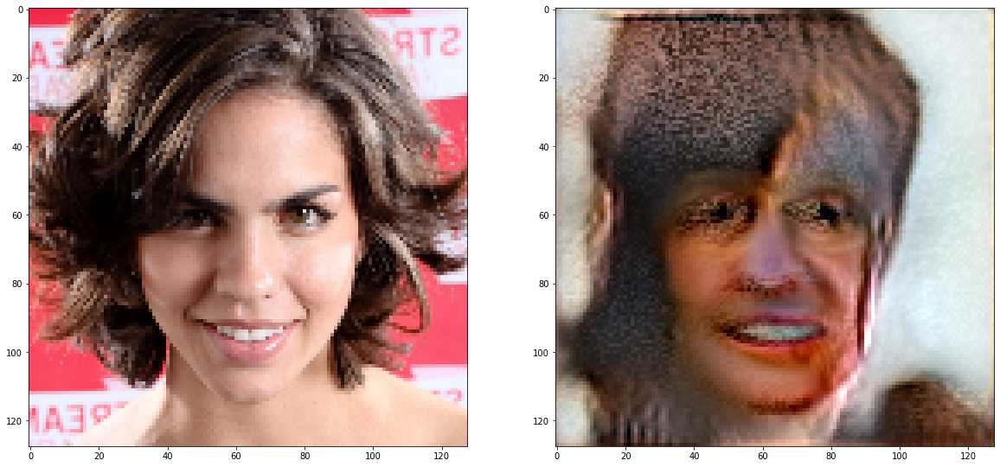

5/6, ITERATION 500 gen_loss: 4.049173 disc_loss: 1.142855


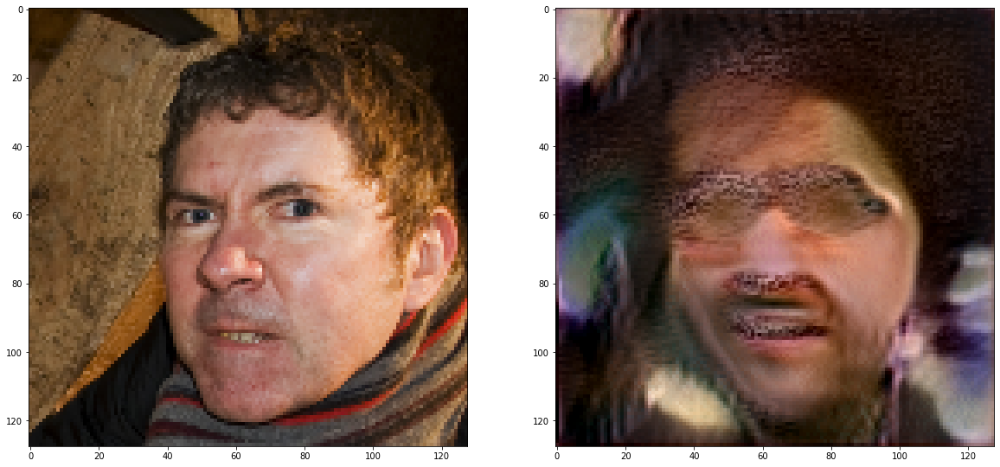

5/6, ITERATION 600 gen_loss: 3.992845 disc_loss: 1.135246


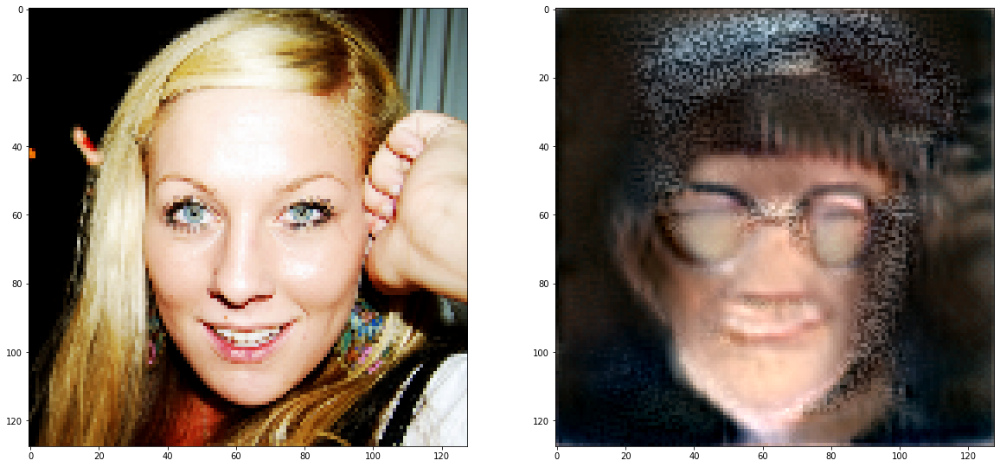

5/6, ITERATION 700 gen_loss: 3.976046 disc_loss: 1.136631


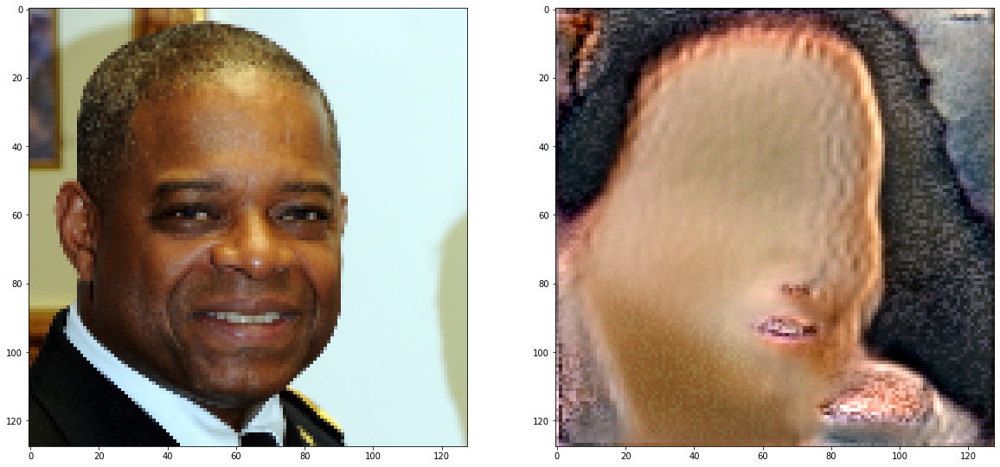

5/6, ITERATION 800 gen_loss: 3.959797 disc_loss: 1.144343


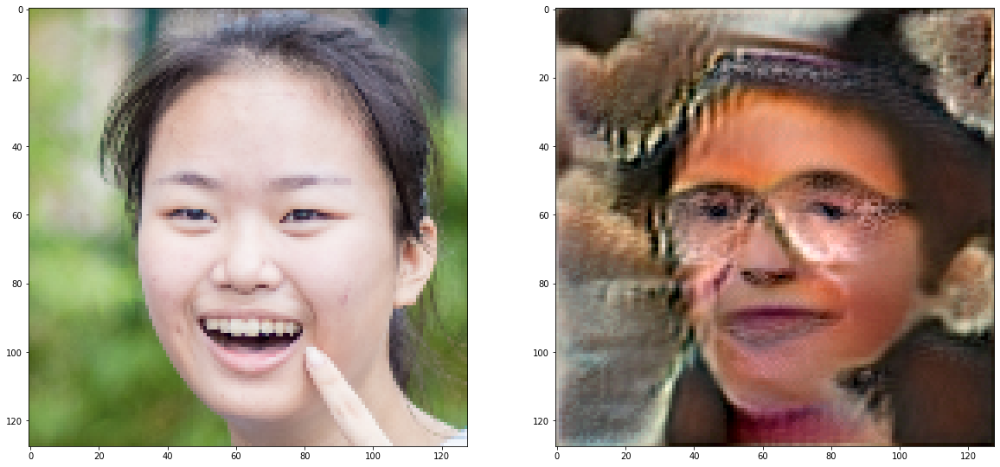

5/6, ITERATION 900 gen_loss: 3.923014 disc_loss: 1.133362


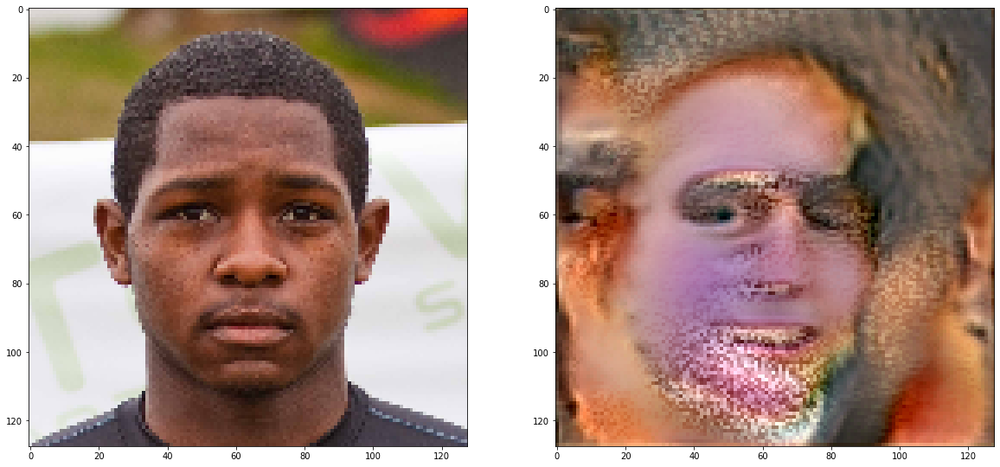

5/6, ITERATION 1000 gen_loss: 3.870849 disc_loss: 1.155664


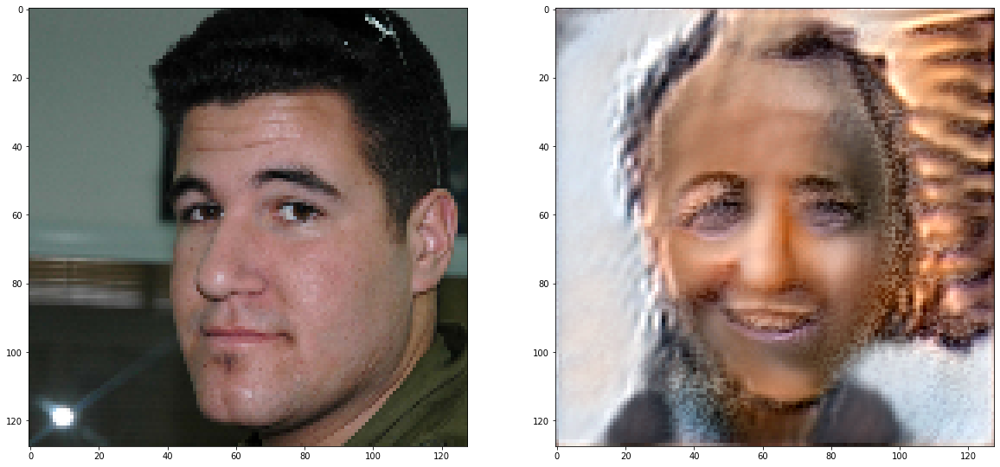

5/6, ITERATION 1100 gen_loss: 3.807674 disc_loss: 1.151952


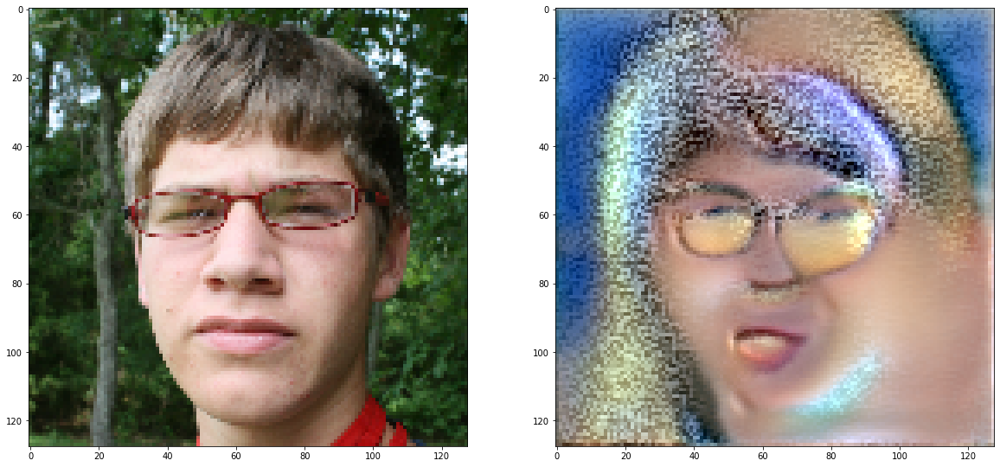

5/6, ITERATION 1200 gen_loss: 3.818928 disc_loss: 1.170513


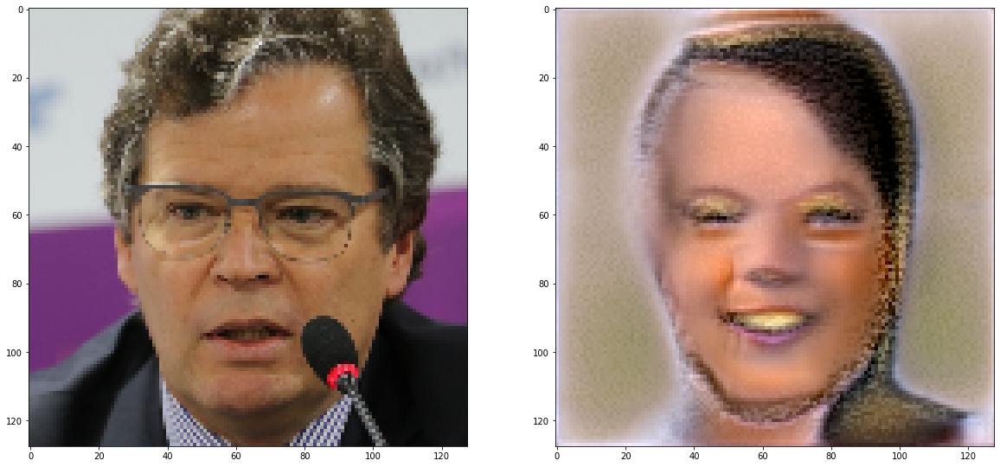

5/6, ITERATION 1300 gen_loss: 3.761327 disc_loss: 1.16376


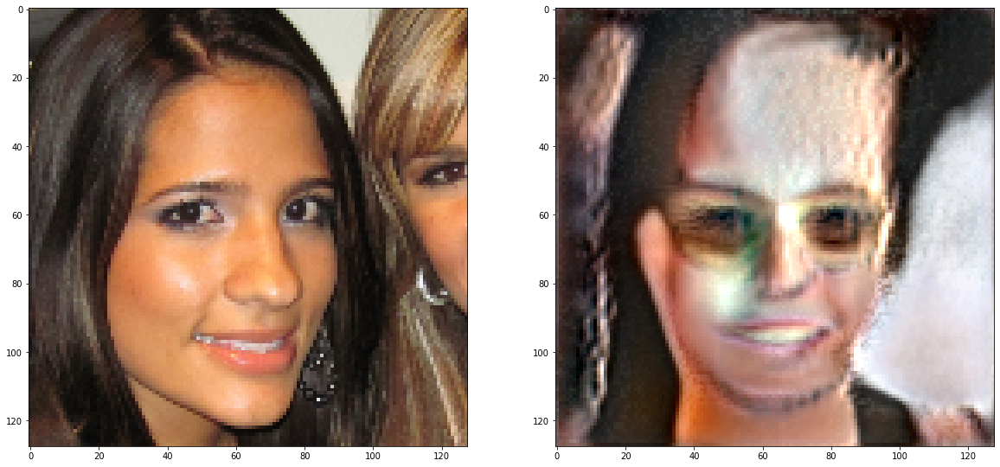

5/6, ITERATION 1400 gen_loss: 3.727513 disc_loss: 1.165056


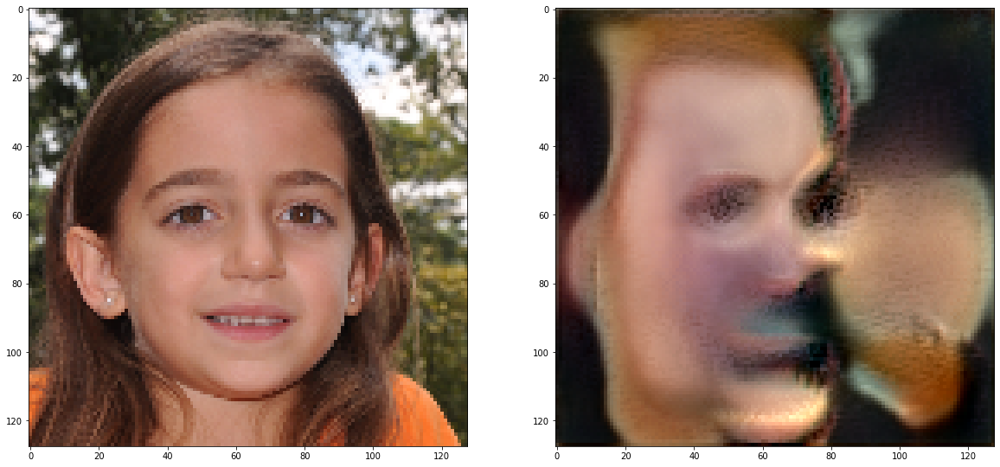

5/6, ITERATION 1500 gen_loss: 3.715243 disc_loss: 1.16949


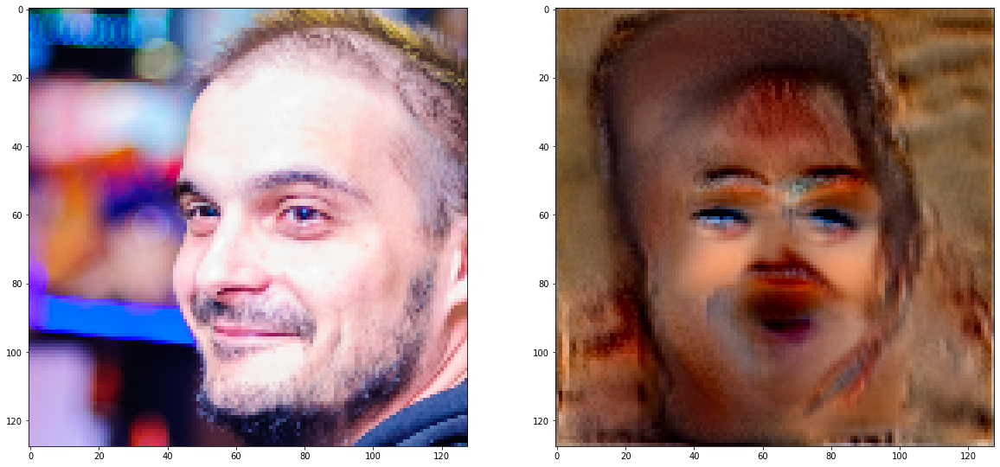

5/6, ITERATION 1600 gen_loss: 3.68648 disc_loss: 1.177457


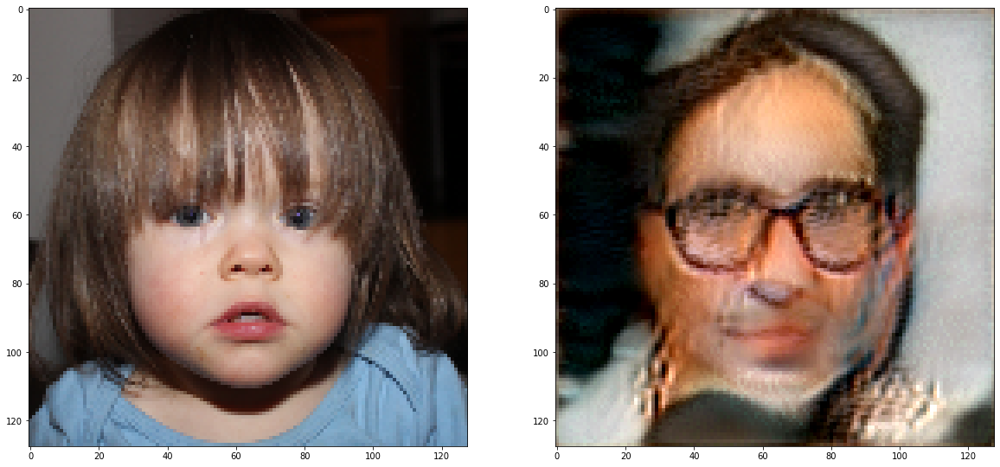

5/6, ITERATION 1700 gen_loss: 3.656589 disc_loss: 1.181159


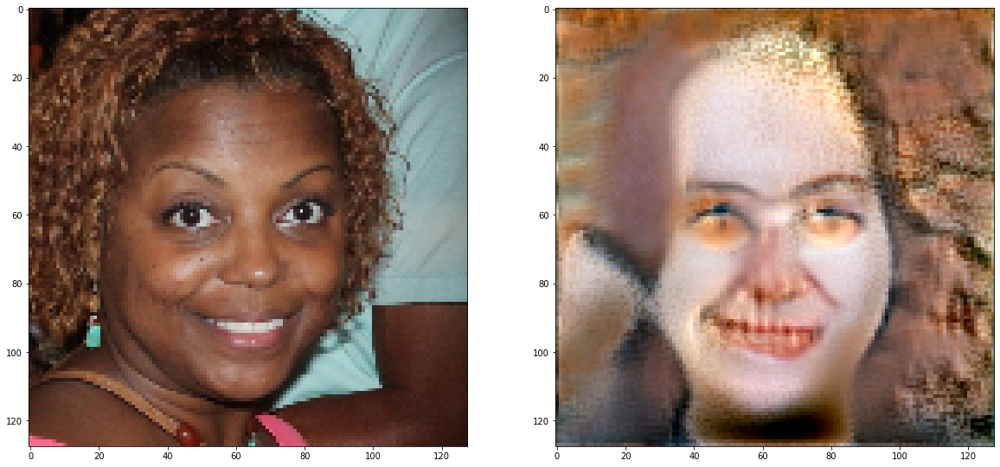

5/6, ITERATION 1800 gen_loss: 3.636581 disc_loss: 1.175169


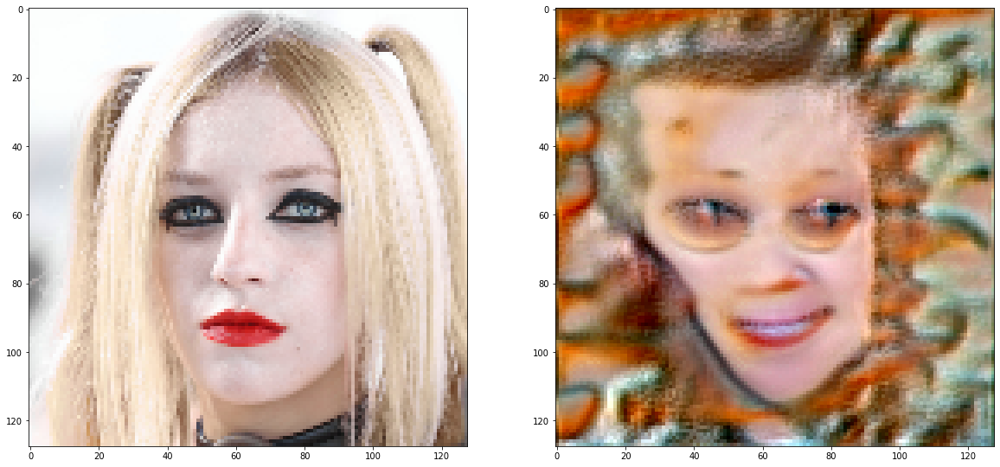

5/6, ITERATION 1900 gen_loss: 3.577393 disc_loss: 1.178359


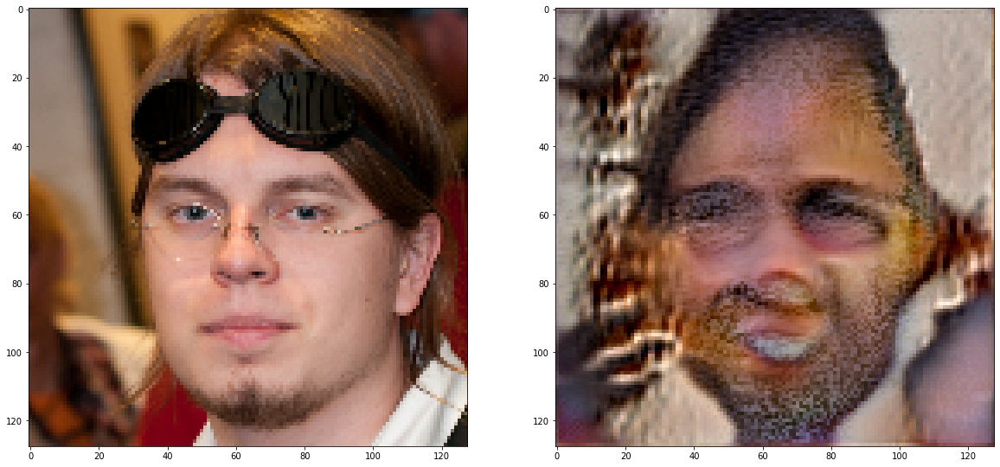

5/6, ITERATION 2000 gen_loss: 3.555894 disc_loss: 1.175181


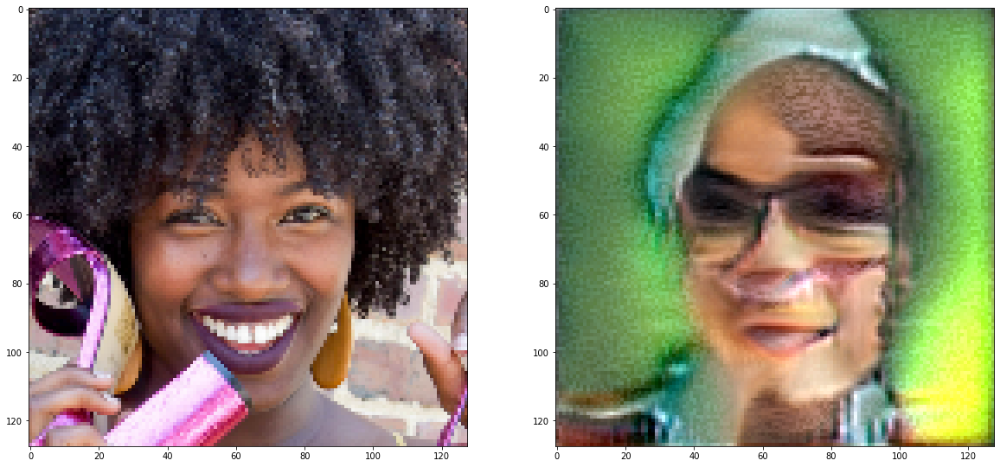

5/6, ITERATION 2100 gen_loss: 3.551994 disc_loss: 1.170864


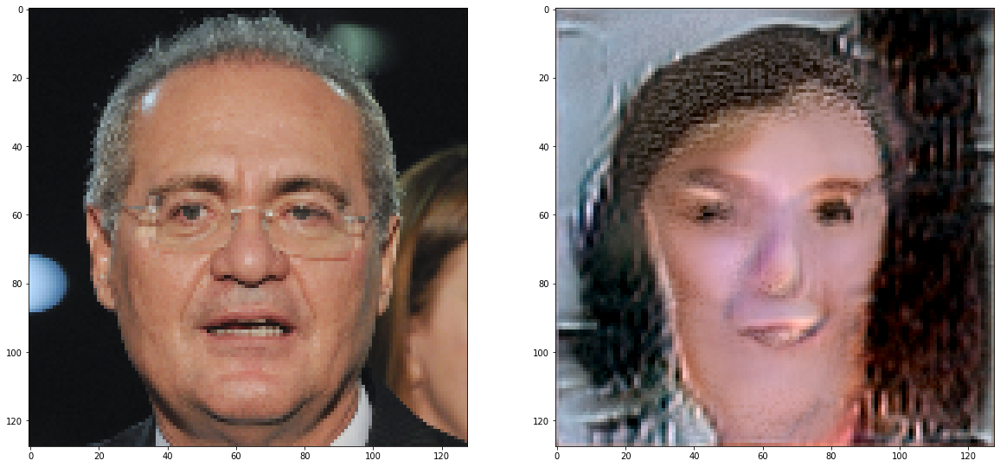

5/6, ITERATION 2200 gen_loss: 3.555726 disc_loss: 1.168561


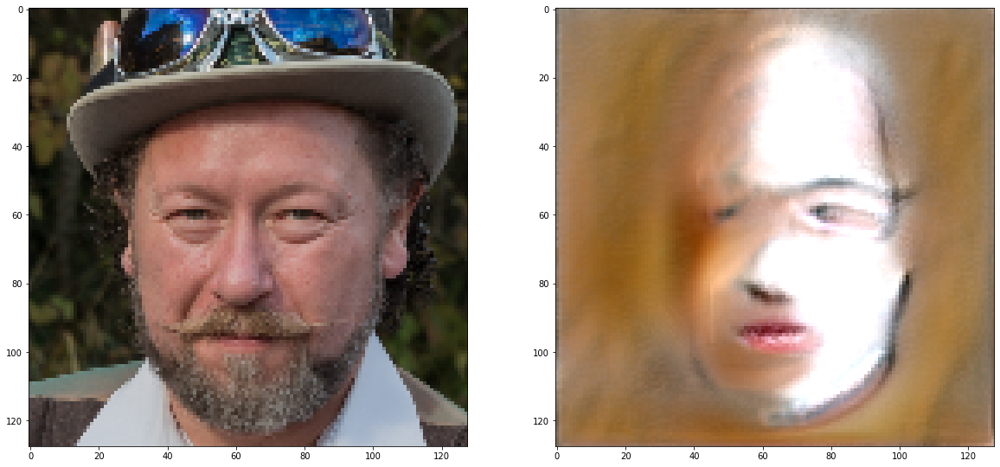

5/6, ITERATION 2300 gen_loss: 3.539916 disc_loss: 1.172827


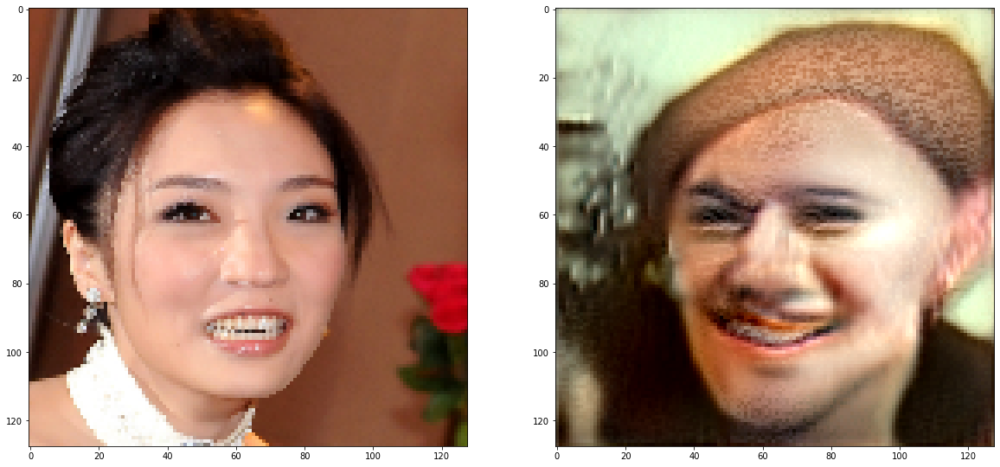

  0%|          | 0/2363 [00:00<?, ?it/s]

6/6, ITERATION 100 gen_loss: 2.680532 disc_loss: 1.238072


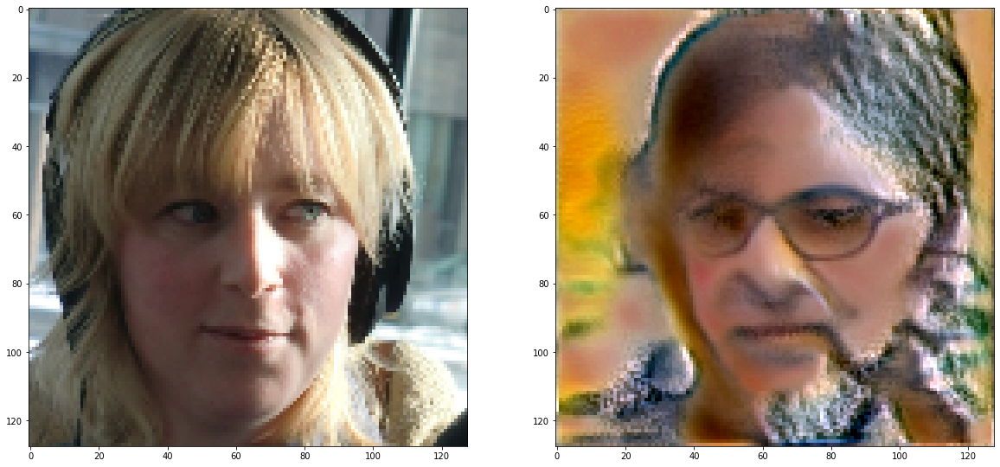

6/6, ITERATION 200 gen_loss: 2.806717 disc_loss: 1.243491


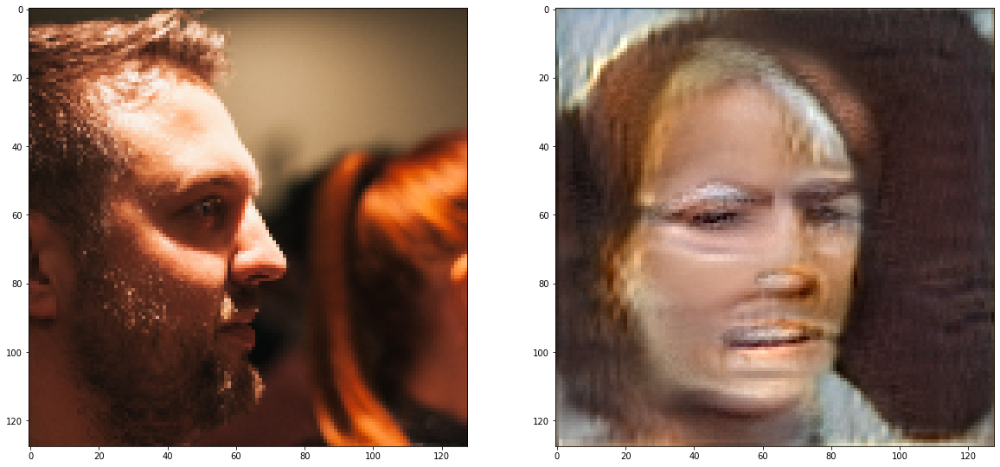

6/6, ITERATION 300 gen_loss: 3.054663 disc_loss: 1.237823


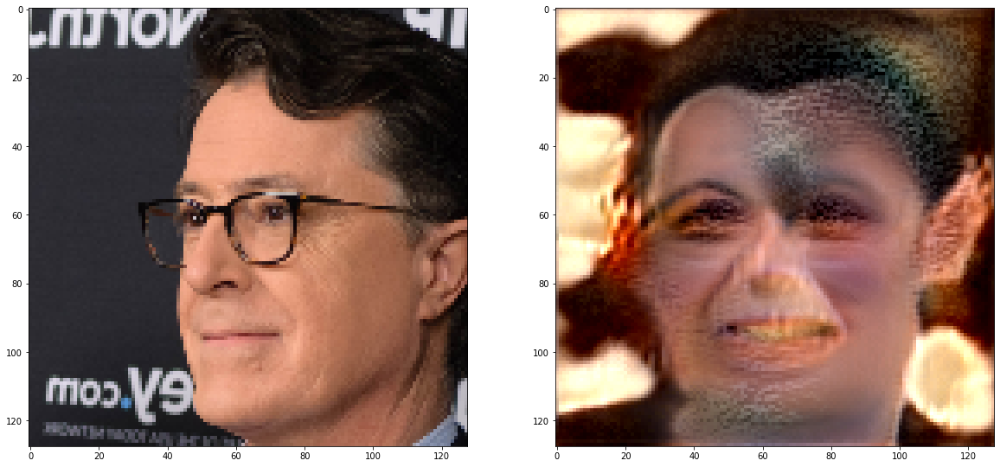

6/6, ITERATION 400 gen_loss: 3.375773 disc_loss: 1.170251


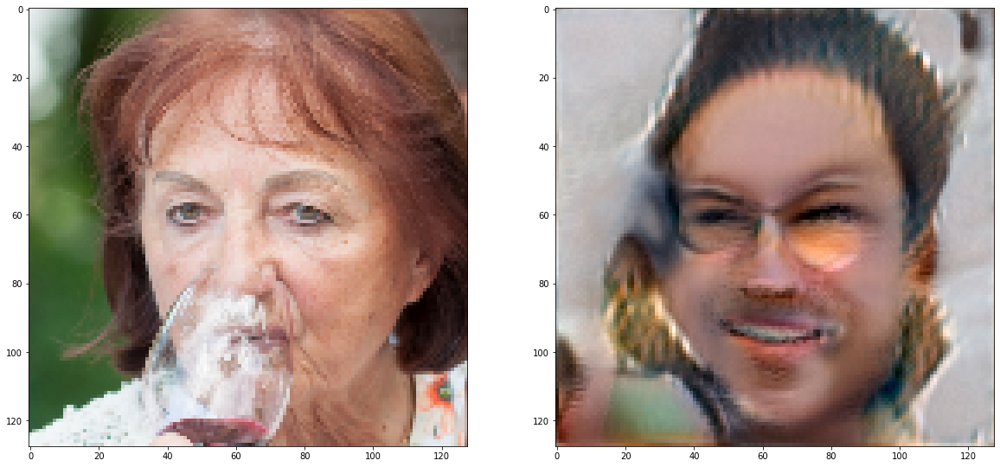

6/6, ITERATION 500 gen_loss: 3.479582 disc_loss: 1.197087


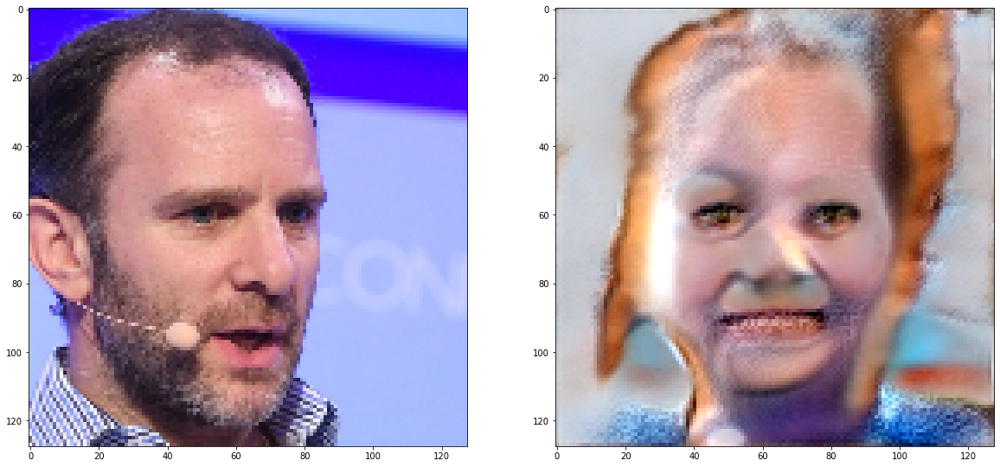

6/6, ITERATION 600 gen_loss: 3.590022 disc_loss: 1.170578


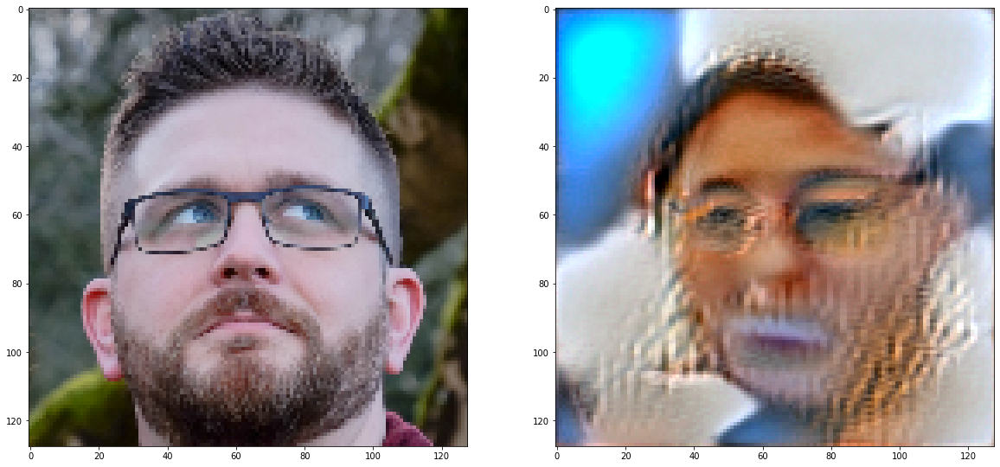

6/6, ITERATION 700 gen_loss: 3.587831 disc_loss: 1.169104


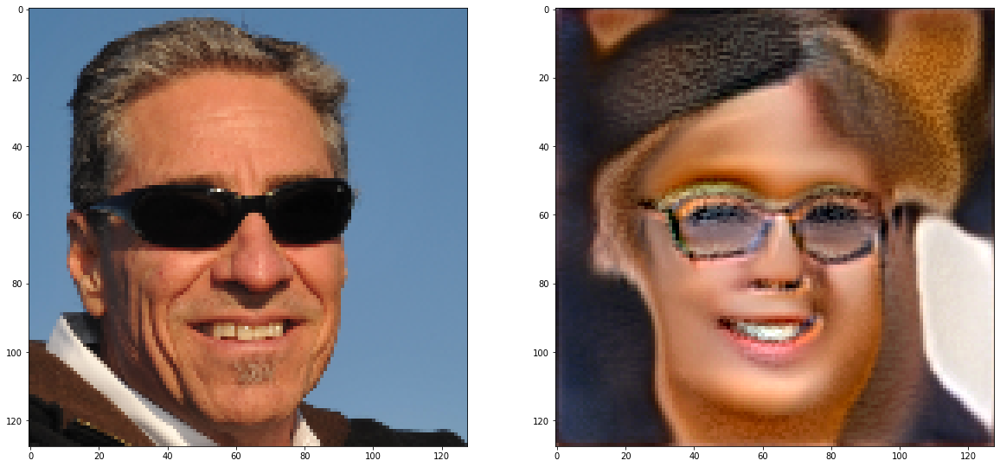

6/6, ITERATION 800 gen_loss: 3.475333 disc_loss: 1.1879


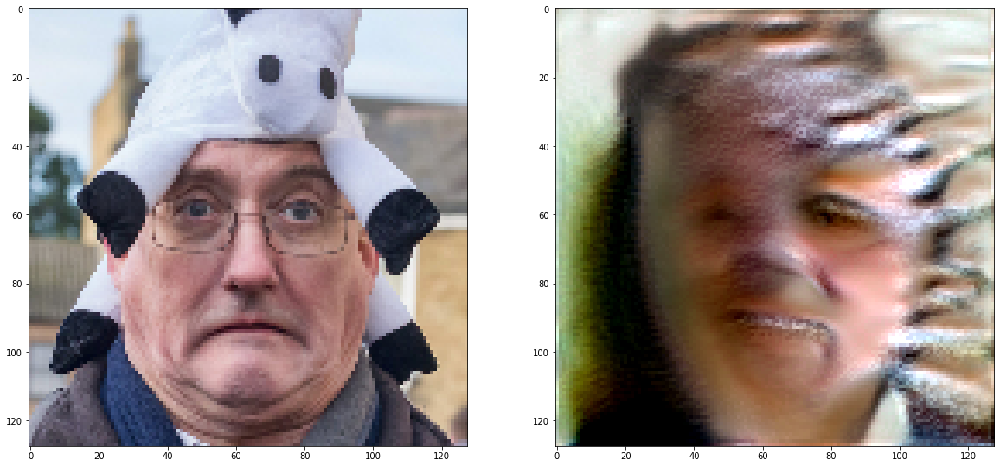

6/6, ITERATION 900 gen_loss: 3.478234 disc_loss: 1.174755


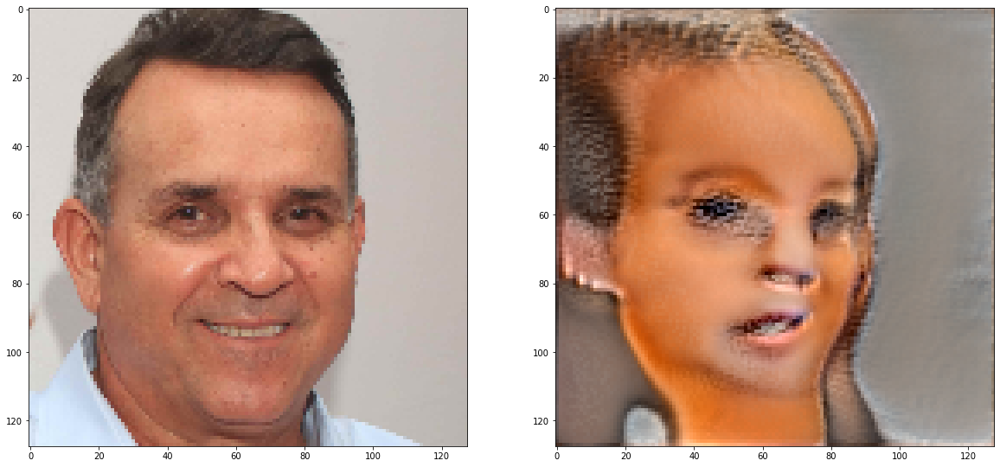

6/6, ITERATION 1000 gen_loss: 3.523101 disc_loss: 1.1768


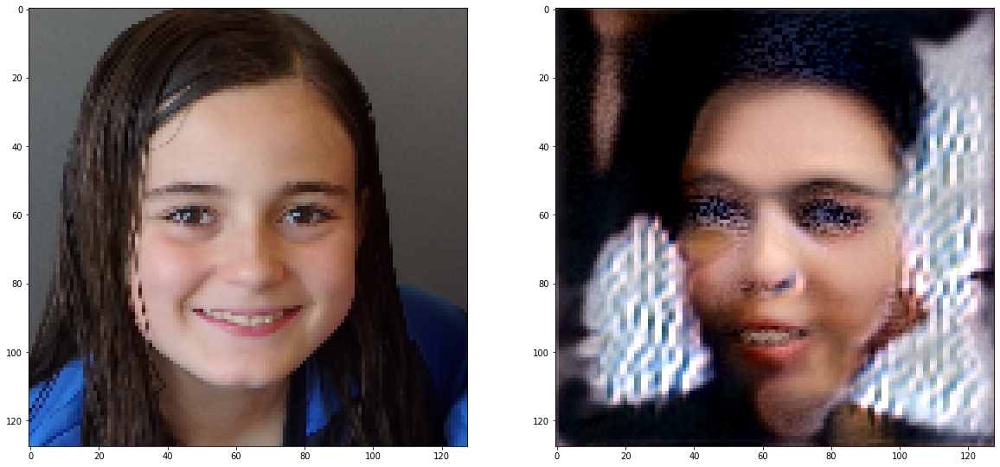

6/6, ITERATION 1100 gen_loss: 3.535466 disc_loss: 1.167138


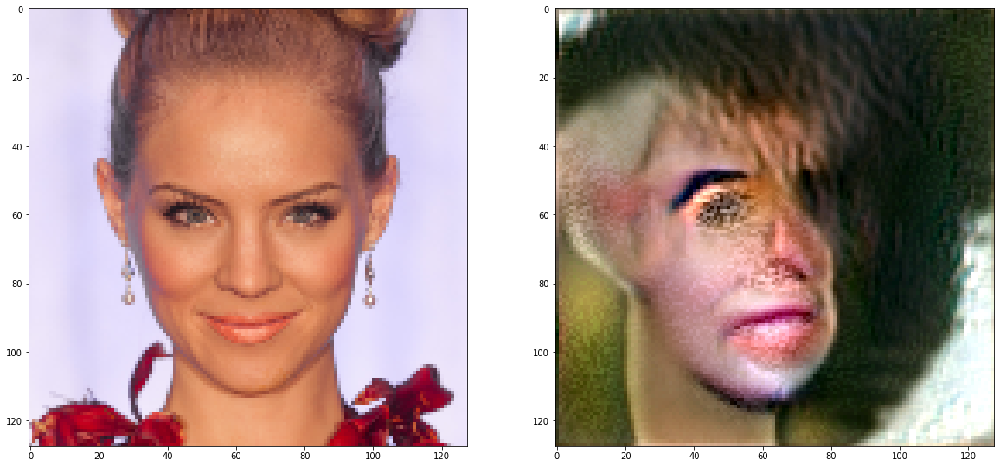

6/6, ITERATION 1200 gen_loss: 3.547544 disc_loss: 1.159345


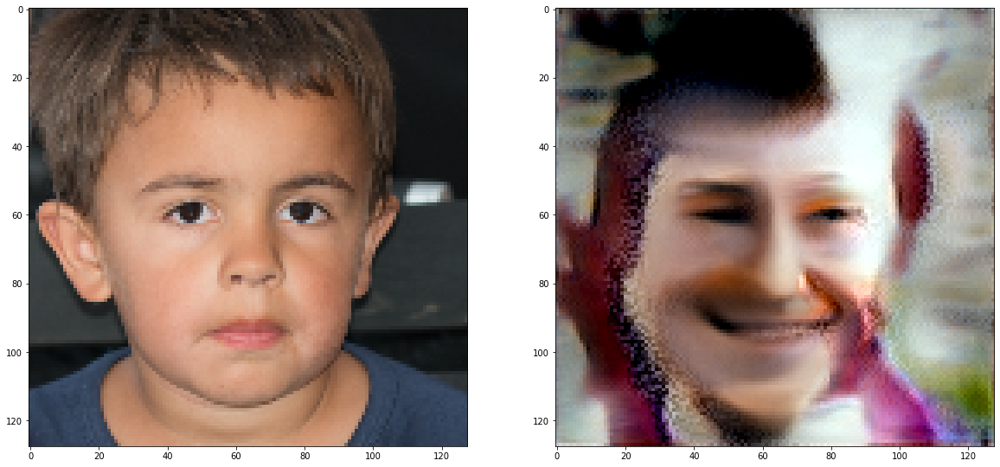

6/6, ITERATION 1300 gen_loss: 3.554777 disc_loss: 1.152908


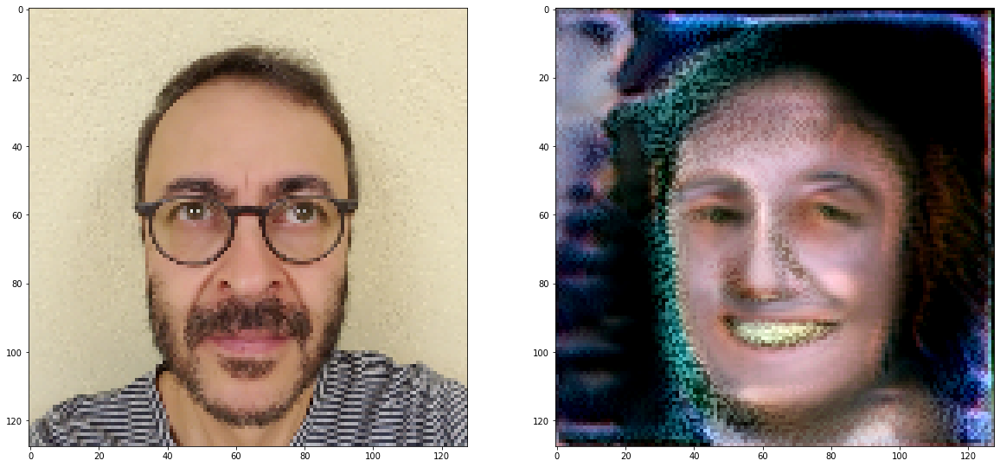

6/6, ITERATION 1400 gen_loss: 3.564351 disc_loss: 1.166646


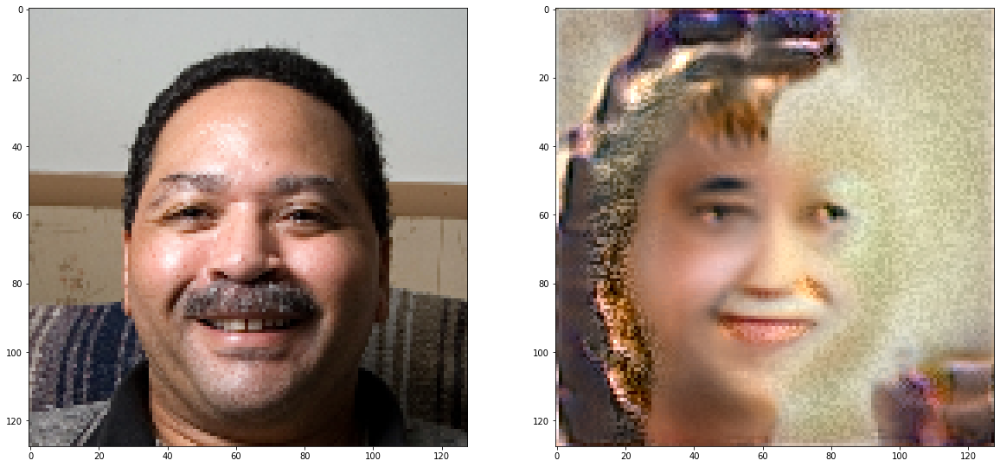

6/6, ITERATION 1500 gen_loss: 3.579126 disc_loss: 1.159293


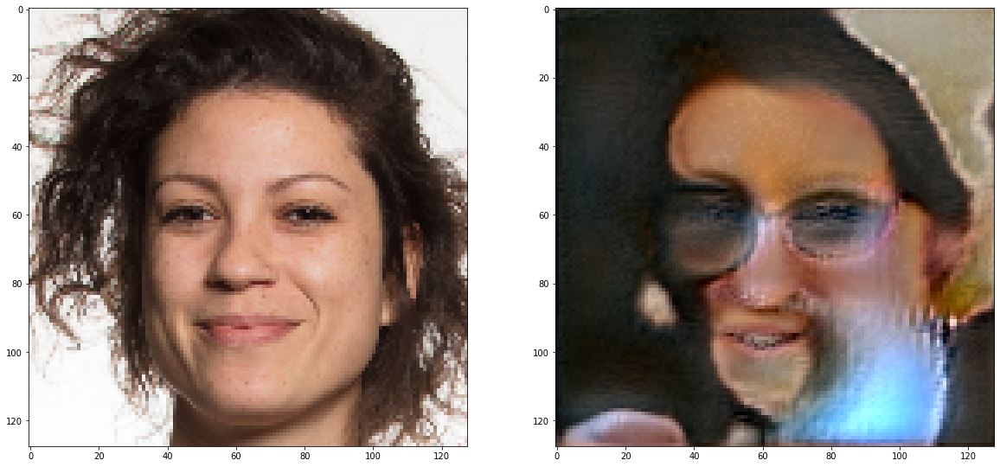

6/6, ITERATION 1600 gen_loss: 3.512103 disc_loss: 1.16926


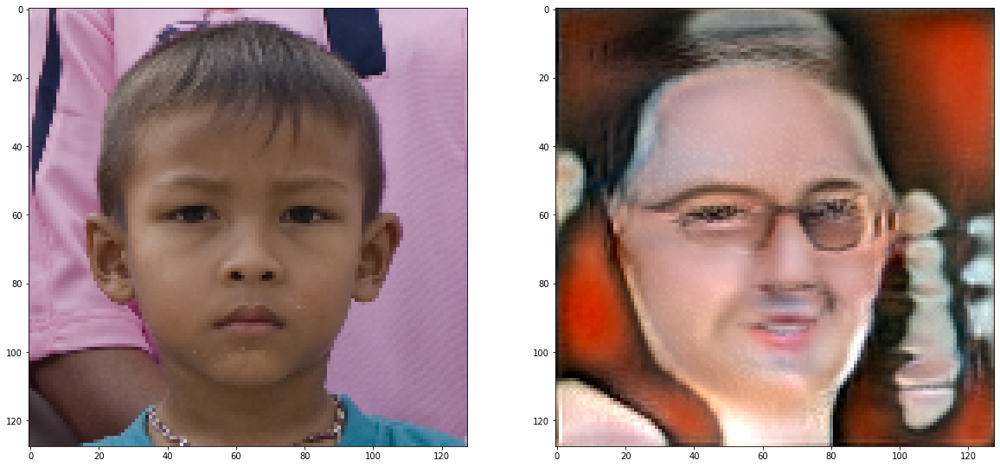

6/6, ITERATION 1700 gen_loss: 3.443176 disc_loss: 1.170942


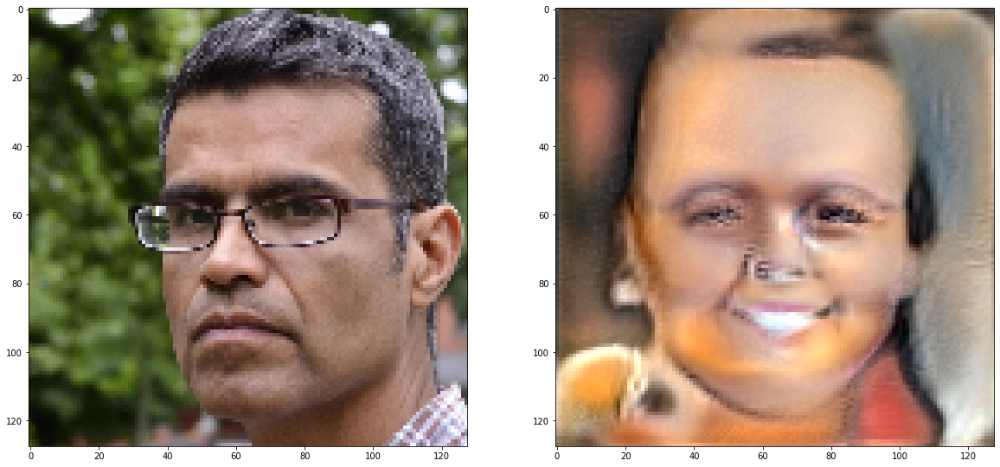

6/6, ITERATION 1800 gen_loss: 3.402648 disc_loss: 1.172505


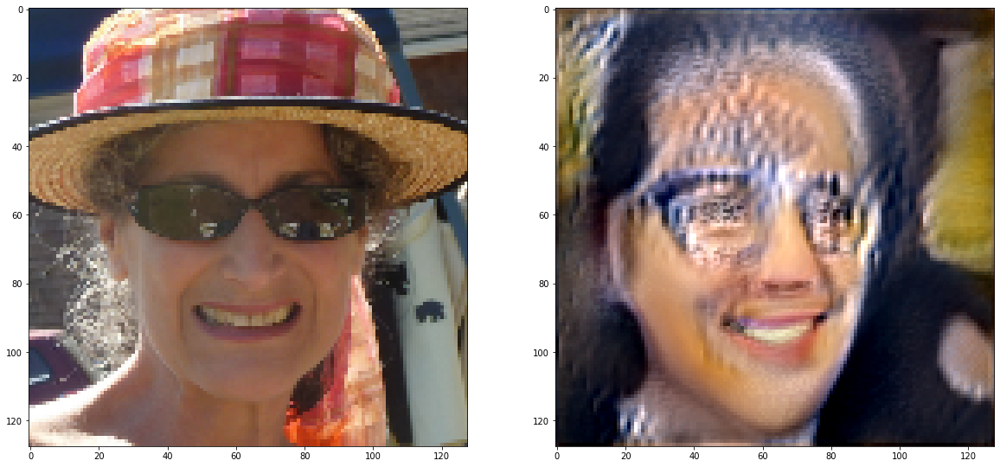

6/6, ITERATION 1900 gen_loss: 3.396727 disc_loss: 1.166046


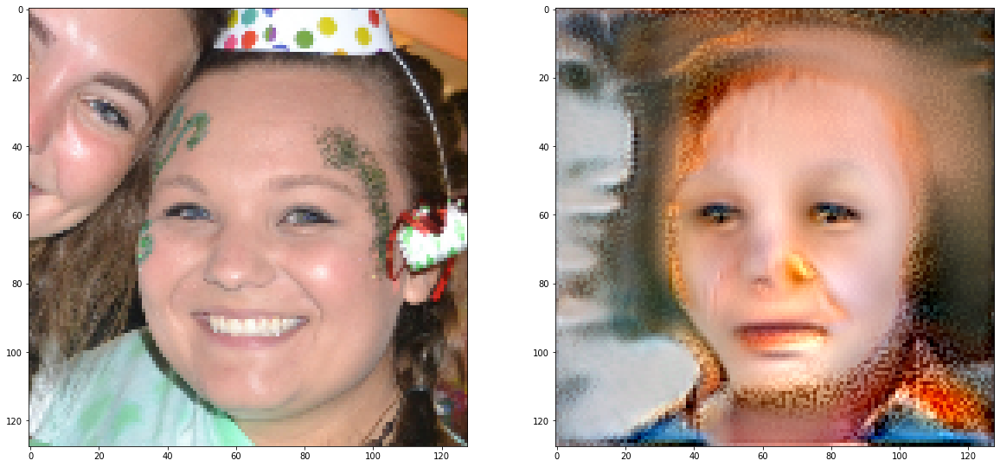

6/6, ITERATION 2000 gen_loss: 3.366025 disc_loss: 1.176357


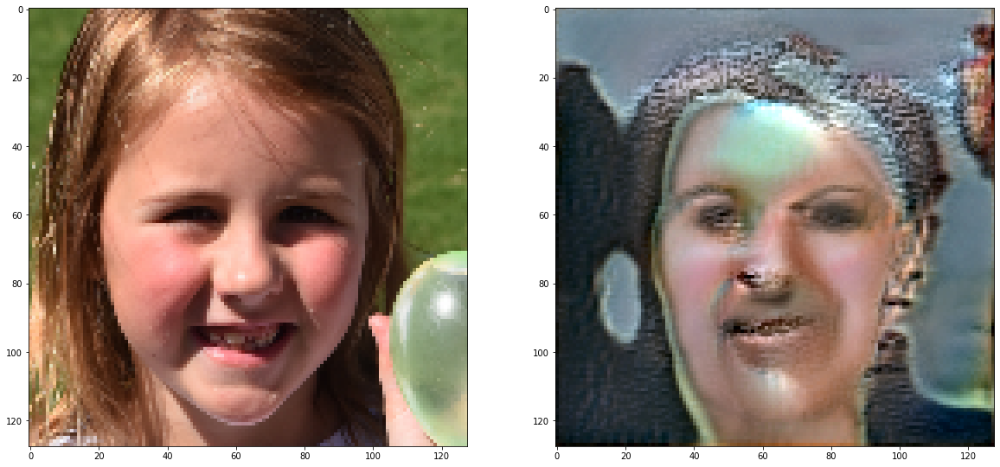

6/6, ITERATION 2100 gen_loss: 3.406749 disc_loss: 1.165383


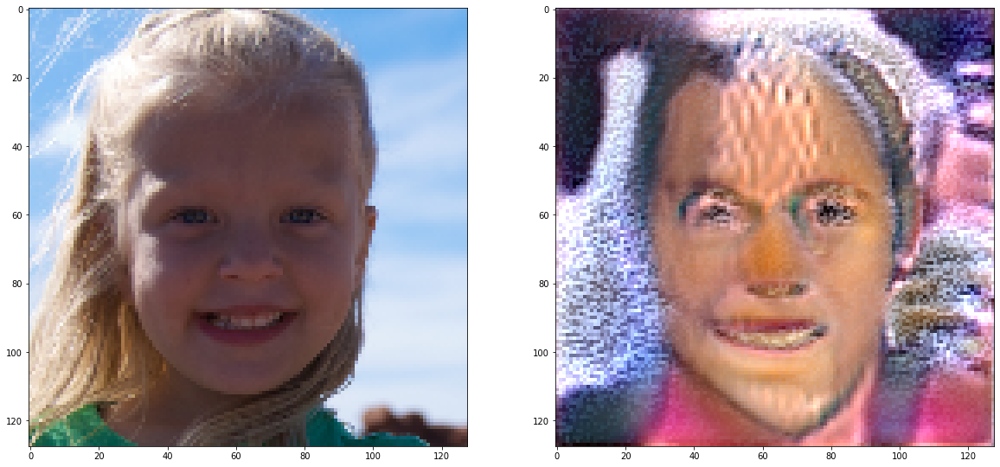

6/6, ITERATION 2200 gen_loss: 3.43124 disc_loss: 1.164993


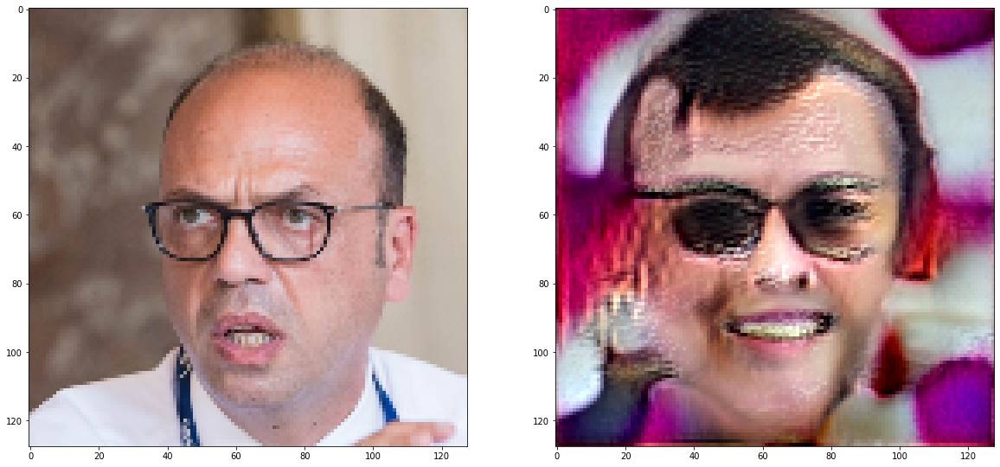

6/6, ITERATION 2300 gen_loss: 3.458698 disc_loss: 1.159771


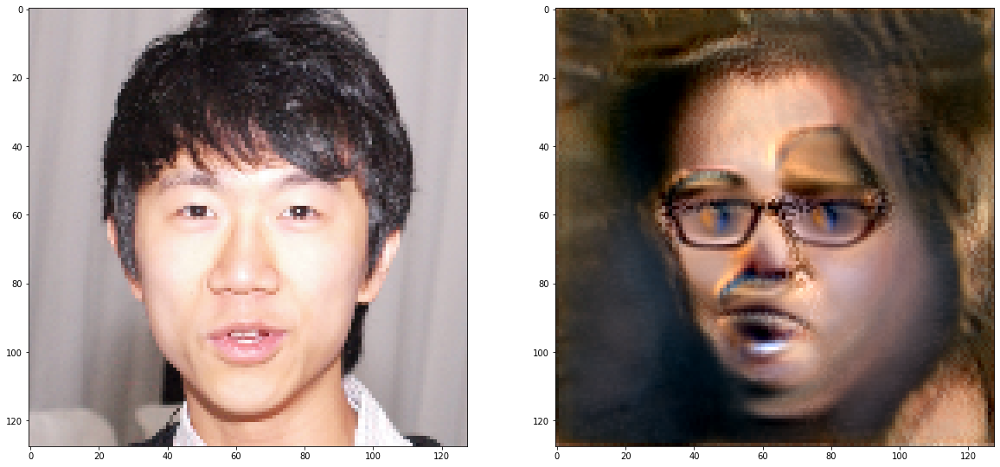

In [6]:
flags = {}

flags['num_epochs'] = 6
flags['seed'] = 1234
flags['grad_clip_value'] = 1.0
flags['use_tpu'] = use_tpu
flags['r1'] = 10
flags['d_reg_every'] = 16
flags['g_reg_every'] = 4

if use_tpu:
    # xmp.spawn(train_fn, args=(flags,), nprocs=8, start_method='fork')
    xmp.spawn(train_fn, args=(flags,), nprocs=8, start_method='fork')
else:
    train_fn(0, flags)